<a href="https://colab.research.google.com/github/keyvany/decision-making-/blob/main/Kopie_von_current_catproject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install ANNArchy

In [ ]:
pip install CompNeuroPy

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from ANNarchy import (
    Neuron,
    Population,
    Projection,
    Synapse,
    setup,
    compile,
    Uniform,
    simulate,


)
import numpy as np
import random
from CompNeuroPy import CompNeuroMonitors, get_full_model, PlotRecordings
# Setup ANNarchy
# Setup ANNarchy
setup(dt=1.0, num_threads=1)

# General parameters
ITdimension = 10
baseline_it = random.uniform(0.0, 0.2)
#response_threshold = 0.4
#nr_fish_presentations = 100

# you have to present multiple times a fish
# --> fish_list contains the fish variants you can present to the model

feature_name_list = ["DF", "TF", "VF", "MA"]


# define the durations of the events
trial_duration = 200
dopamine_input_duration = 300
deactivate_input_duration = 30
calcium_trace_decline_duration = 100




# Adjusted general parametersITdimension = 12baseline_it = random.uniform(0.0, 0.2)response_threshold = 0.6nr_fish_presentations = 150
# Adjusted durations of eventstrial_duration = 250dopamine_input_duration = 350deactivate_input_duration = 25calcium_trace_decline_duration = 120
# Neuron models
# In Fran's version SaturatedNeuron=LinearNeuron and NormalizationNeuron=LinearNeuron and LinearNeuronPFC=LinearNeuron
LinearNeuron = Neuron(
    parameters="""
        tau = 15.0
        baseline = 0.0
        noise = 0.0
    """,
    equations="""
        tau*dmp/dt + mp = sum(exc) - sum(inh) + baseline + noise*Uniform(-1.0,1.0)
        r = pos(mp)
    """,
)

DopamineNeuron = Neuron(
    parameters="""
        tau = 10.0
        firing = 0
        inhibition = 0.0
        baseline = 0.0
    """,
    equations="""
        ex_in = if (sum(exc)>0): 1 else: 0
        s_inh = sum(inh)
        aux = if (firing>0): (ex_in)*(pos(1.0-baseline-s_inh) + baseline) + (1-ex_in)*(-10*sum(inh)+baseline)  else: baseline
        tau*dmp/dt + mp =  aux
        r = if (mp>0.0): mp else: 0.0
    """,
)

InputNeuron = Neuron(
    parameters="""
        tau = 1.5
        baseline = 0.0
    """,
    equations="""
        tau*dmp/dt + mp = baseline
        baseline_rec = baseline
        r = if (mp>0.0): mp else: 0.0
    """,
)


# Synapse models



# Adjusted dopamine condition
max_dopa = 1.0
baseline_dopa = 0.3
baseline_snc = 0.15
K_dip = 0.3

# Adjusted parameters for Synapse models
PostCovariance = Synapse(
    parameters="""
        tau = 1200.0
        tau_alpha = 15.0
        regularization_threshold = 0.8
        threshold_post = 0.1
        threshold_pre = 0.1
    """,
    equations="""
        tau_alpha * dalpha/dt + alpha = pos(post.mp - regularization_threshold)
        trace = (pre.r - mean(pre.r) - threshold_pre) * pos(post.r - mean(post.r) - threshold_post)
        delta = (trace - alpha * pos(post.r - mean(post.r) - threshold_post) * pos(post.r - mean(post.r) - threshold_post) * w)
        tau * dw/dt = delta : min=0
    """,
)

ReversedSynapse = Synapse(
    parameters="""
        reversal = 0.8
    """,
    psp="""
        w * pos(reversal - pre.r)
    """,
)

DAPostCovarianceNoThreshold = Synapse(
    parameters="""
        tau = 1200.0
        tau_alpha = 15.0
        regularization_threshold = 0.8
        baseline_dopa = 0.2
        K_burst = 0.8
        K_dip = 0.3
        DA_type = 1
        threshold_pre = 0.05
        threshold_post = 0.05
    """,
    equations="""
        tau_alpha * dalpha/dt + alpha = pos(post.mp - regularization_threshold)
        dopa_sum = 1.8 * (post.sum(dopa) - baseline_dopa)
        trace = pos(post.r - mean(post.r) - threshold_post) * (pre.r - mean(pre.r) - threshold_pre)
        condition_0 = if (trace > 0.0) and (w > 0.0): 1 else: 0
        dopa_mod = if (DA_type * dopa_sum > 0): DA_type * K_burst * dopa_sum else: condition_0 * DA_type * K_dip * dopa_sum
    """,
)

# Excitatory synapses STN -> GPi
DAPreCovariance_excitatory = Synapse(
    parameters="""
    tau=1000.0
    tau_alpha=10.0
    regularization_threshold=1.0
    baseline_dopa = 0.1
    K_burst = 1.0
    K_dip = 0.4
    DA_type= 1
    threshold_pre=0.0
    threshold_post=0.0
    """,
    equations="""
        tau_alpha*dalpha/dt  = pos( post.mp - regularization_threshold) - alpha
        dopa_sum = 2.0*(post.sum(dopa) - baseline_dopa)

        trace = pos(pre.r - mean(pre.r) - threshold_pre) * (post.r - mean(post.r) - threshold_post)
        aux = if (trace<0.0): 1 else: 0
        dopa_mod = if (dopa_sum>0): K_burst * dopa_sum else: K_dip * dopa_sum * aux
        delta = dopa_mod * trace - alpha * pos(trace)
        tau*dw/dt = delta : min=0


    """,
)

# Inhibitory synapses GPi -> GPi and STRD2 -> GPe
DAPreCovariance_inhibitory = Synapse(
    parameters="""
    tau=1000.0
    tau_alpha=10.0
    regularization_threshold=1.0
    baseline_dopa = 0.1
    K_burst = 1.0
    K_dip = 0.4
    DA_type= 1
    threshold_pre=0.0
    threshold_post=0.0
    """,
    equations="""
        tau_alpha*dalpha/dt = pos( -post.mp - regularization_threshold) - alpha
        dopa_sum = 2.0*(post.sum(dopa) - baseline_dopa)

        trace = pos(pre.r - mean(pre.r) - threshold_pre) * (mean(post.r) - post.r  - threshold_post)
        aux = if (trace>0): 1 else: 0

        dopa_mod = if (DA_type*dopa_sum>0): DA_type*K_burst*dopa_sum else: aux*DA_type*K_dip*dopa_sum

        delta = dopa_mod * trace - alpha * pos(trace)
        tau*dw/dt = delta : min=0
    """,
)

DAPrediction = Synapse(
    parameters="""
        tau = 100000.0
        baseline_dopa = 0.1
   """,
    equations="""
       aux = if (post.sum(exc)>0): 1.0 else: 3.0
       delta = aux*(post.r - baseline_dopa)*pos(pre.r - mean(pre.r))
       tau*dw/dt = delta : min=0
   """,
)


# Populations
# IT Input
IT = Population(name="IT", geometry=(ITdimension, ITdimension), neuron=InputNeuron)
IT.tau = 100.0
IT.baseline = baseline_it

# Reward Input
Reward_Layer = Population(name="Reward_Layer", geometry=1, neuron=InputNeuron)
Reward_Layer.tau = 1.0

# PFC_MTL
MTL = Population(name="PFC_MTL", geometry=(4, 9), neuron=LinearNeuron)
MTL.tau = 10.0
MTL.noise = 0.05
MTL.baseline = 0.0

# SNc
SNc = Population(name="SNc", geometry=1, neuron=DopamineNeuron)
SNc.tau = 10.0
SNc.firing = 1.0
SNc.baseline = baseline_snc

# Striatum direct pathway
StrD1 = Population(name="StrD1", geometry=(4, 4), neuron=LinearNeuron)
StrD1.tau = 10.0
StrD1.noise = 0.1
StrD1.baseline = 0.4

# Striatum indirect pathway
StrD2 = Population(name="StrD2", geometry=(4, 4), neuron=LinearNeuron)
StrD2.tau = 10.0
StrD2.noise = 0.1
StrD2.baseline = 0.4

# Striatum feedback pathway
StrThal = Population(name="StrThal-PFC", geometry=2, neuron=LinearNeuron)
StrThal.tau = 10.0
StrThal.noise = 0.1
StrThal.baseline = 0.4

# GPi
GPi = Population(name="GPi-PFC", geometry=2, neuron=LinearNeuron)
GPi.tau = 1000.0
GPi.noise = 0.1
GPi.baseline = 2.4

# STN
STN = Population(name="STN", geometry=(4, 4), neuron=LinearNeuron)
STN.tau = 11.0 # Adjusted STN tau parameter
STN.noise = 0.1
STN.baseline = 0.4

# GPe
GPe = Population(name="GPe", geometry=2, neuron=LinearNeuron)
GPe.tau = 10.0
GPe.noise = 1.0
GPe.baseline = 1.0

# VA
VA = Population(name="VA-PFC", geometry=2, neuron=LinearNeuron)
VA.tau = 1000.0
VA.noise = 0.0001
VA.baseline = 0.4

# PM
PM = Population(name="PM", geometry=2, neuron=LinearNeuron)
PM.tau = 1200.0 # Adjusted PM tau parameter
PM.noise = 0.01
PM.baseline = 0.0
# Projections



# Projections

ITMTL = Projection(pre=IT, post=MTL, target="exc", synapse=PostCovariance)
ITMTL.connect_all_to_all(weights=Uniform(0.2, 0.4))  # Normal(0.3,0.1) )
ITMTL.tau = 15000
ITMTL.regularization_threshold = 3.5
ITMTL.tau_alpha = 1.0
ITMTL.baseline_dopa = baseline_dopa
ITMTL.threshold_post = 0.0
ITMTL.thrshold_pre = 0.15

MTLVA_11 = Projection(pre=MTL[0:8], post=VA[0], target="exc")
MTLVA_11.connect_all_to_all(weights=0.15)
MTLVA_22 = Projection(pre=MTL[8:16], post=VA[1], target="exc")
MTLVA_22.connect_all_to_all(weights=0.15)


IT_StrD1 = Projection(
    pre=IT, post=StrD1, target="exc", synapse=DAPostCovarianceNoThreshold
)
IT_StrD1.connect_all_to_all(weights=Uniform(0, 0.3))  # Normal(0.15,0.15))
IT_StrD1.tau = 75.0
IT_StrD1.regularization_threshold = 1.0
IT_StrD1.tau_alpha = 1.0
IT_StrD1.baseline_dopa = baseline_dopa
IT_StrD1.K_dip = 0.4
IT_StrD1.K_burst = 1.0
IT_StrD1.DA_type = 1
IT_StrD1.threshold_pre = 0.15

IT_StrD2 = Projection(
    pre=IT, post=StrD2, target="exc", synapse=DAPostCovarianceNoThreshold
)
IT_StrD2.connect_all_to_all(weights=Uniform(0, 0.3))  # Normal(0.15,0.15))
IT_StrD2.tau = 75.0
IT_StrD2.regularization_threshold = 1.0
IT_StrD2.tau_alpha = 1.0
IT_StrD2.baseline_dopa = baseline_dopa
IT_StrD2.K_dip = 0.4
IT_StrD2.K_burst = 1.0
IT_StrD2.DA_type = -1
IT.threshold_pre = 0.15

IT_STN = Projection(pre=IT, post=STN, target="exc",
                    synapse=DAPostCovarianceNoThreshold)
IT_STN.connect_all_to_all(weights=Uniform(0, 0.3))  # Normal(0.15,0.15))
IT_STN.tau = 75.0
IT_STN.regularization_threshold = 1.0
IT_STN.tau_alpha = 1.0
IT_STN.baseline_dopa = baseline_dopa
IT_STN.K_dip = 0.4
IT_STN.K_burst = 1.0
IT_STN.DA_type = 1
IT_STN.threshold_pre = 0.15

Reward_LayerSNc = Projection(pre=Reward_Layer, post=SNc, target="exc")
Reward_LayerSNc.connect_all_to_all(weights=1.0)

VAMTL_11 = Projection(pre=VA[0], post=MTL[0:8], target="exc")
VAMTL_11.connect_all_to_all(weights=0.35)
VAMTL_22 = Projection(pre=VA[1], post=MTL[8:16], target="exc")
VAMTL_22.connect_all_to_all(weights=0.35)

VAPM = Projection(pre=VA, post=PM, target="exc")
VAPM.connect_one_to_one(weights=1.7)

StrD1StrD1 = Projection(pre=StrD1, post=StrD1, target="inh")
StrD1StrD1.connect_all_to_all(weights=0.3)

STNSTN = Projection(pre=STN, post=STN, target="inh")
STNSTN.connect_all_to_all(weights=0.3)

MTLMTL = Projection(pre=MTL, post=MTL, target="inh")
MTLMTL.connect_all_to_all(weights=0.1)

#PMPM = Projection(pre=PM, post=PM, target="inh")
#PMPM.connect_all_to_all(weights=-0.1)

StrD2StrD2 = Projection(pre=StrD2, post=StrD2, target="inh")
StrD2StrD2.connect_all_to_all(weights=0.3)

StrThalStrThal = Projection(pre=StrThal, post=StrThal, target="inh")
StrThalStrThal.connect_all_to_all(weights=0.3)

GPi_GPi = Projection(pre=GPi, post=GPi, target="exc", synapse=ReversedSynapse)
GPi_GPi.connect_all_to_all(weights=1.0)

StrD1_GPi = Projection(
    pre=StrD1, post=GPi, target="inh", synapse=DAPreCovariance_inhibitory
)
StrD1_GPi.connect_all_to_all(weights=Uniform(0, 0.05))  # Normal(0.025,0.025))
StrD1_GPi.tau = 50.0
StrD1_GPi.regularization_threshold = 1.0
StrD1_GPi.tau_alpha = 1.0
StrD1_GPi.baseline_dopa = baseline_dopa
StrD1_GPi.K_dip = 0.4
StrD1_GPi.threshold_post = 0.15
StrD1_GPi.DA_type = 1

STN_GPi = Projection(
    pre=STN, post=GPi, target="exc", synapse=DAPreCovariance_excitatory
)
STN_GPi.connect_all_to_all(weights=Uniform(0, 0.05))  # Normal(0.025,0.025))
STN_GPi.tau = 50.0
STN_GPi.regularization_threshold = 2.6
STN_GPi.tau_alpha = 1.0
STN_GPi.baseline_dopa = baseline_dopa
STN_GPi.K_dip = 0.4
STN_GPi.thresholdpost = -0.15
STN_GPi.DA_type = 1

StrD2_GPe = Projection(
    pre=StrD2, post=GPe, target="inh", synapse=DAPreCovariance_inhibitory

)
StrD2_GPe.connect_all_to_all(weights=Uniform(0, 0.05))  # Normal(0.025,0.025))
StrD2_GPe.tau = 50.0
StrD2_GPe.regularization_threshold = 2.0
StrD2_GPe.tau_alpha = 1.0
StrD2_GPe.baseline_dopa = baseline_dopa
StrD2_GPe.K_dip = 0.4
StrD2_GPe.threshold_post = 0.15
StrD2_GPe.DA_type = -1

StrD2_SNc = Projection(pre=StrD2, post=SNc, target="inh", synapse=DAPrediction)
StrD2_SNc.connect_all_to_all(weights=0.0)
StrD2_SNc.tau = 100000
StrD2_SNc.baseline_dopa = baseline_dopa

StrD1_SNc = Projection(pre=StrD1, post=SNc, target="inh", synapse=DAPrediction)
StrD1_SNc.connect_all_to_all(weights=0.0)
StrD1_SNc.tau = 100000
StrD1_SNc.baseline_dopa = baseline_dopa

GPe_GPi = Projection(pre=GPe, post=GPi, target="inh")
GPe_GPi.connect_one_to_one(weights=1.5)

#GPe_STN = Projection(pre=GPe, post=STN, target="inh")
#GPe_STN.connect_all_to_all(weights=1.0)

VAStr_Thal = Projection(pre=VA, post=StrThal, target="exc")
VAStr_Thal.connect_one_to_one(weights=1.0)

StrThal_GPe = Projection(pre=StrThal, post=GPe, target="inh")
StrThal_GPe.connect_one_to_one(weights=0.3)

StrThal_GPi = Projection(pre=StrThal, post=GPi, target="inh")
StrThal_GPi.connect_one_to_one(weights=0.3)

GPi_VA = Projection(pre=GPi, post=VA, target="inh")
GPi_VA.connect_one_to_one(weights=0.5)

SNc_StrD1 = Projection(pre=SNc, post=StrD1, target="dopa")
SNc_StrD1.connect_all_to_all(weights=1.0)

SNc_StrD2 = Projection(pre=SNc, post=StrD2, target="dopa")
SNc_StrD2.connect_all_to_all(weights=1.0)

SNc_GPi = Projection(pre=SNc, post=GPi, target="dopa")
SNc_GPi.connect_all_to_all(weights=1.0)

SNc_STN = Projection(pre=SNc, post=STN, target="dopa")
SNc_STN.connect_all_to_all(weights=1.0)

SNc_GPe = Projection(pre=SNc, post=GPe, target="dopa")
SNc_GPe.connect_all_to_all(weights=1.0)

SNc_MTL = Projection(pre=SNc, post=MTL, target="dopa")
SNc_MTL.connect_all_to_all(weights=1.0)

SNc_VA = Projection(pre=SNc, post=VA, target="dopa")
SNc_VA.connect_all_to_all(weights=1.0)



compile()

ANNarchy 4.8 (4.8.1) on linux (posix).


In [ ]:
import torch
from torch import nn
import random

# General parameters
ITdimension = 10
baseline_it = torch.tensor(random.uniform(0.0, 0.3), requires_grad=True)
response_threshold = torch.tensor(0.6, requires_grad=True)

# Adjusted general parameters
ITdimension = 10
baseline_it = torch.tensor(random.uniform(0.0, 0.5), requires_grad=True)
baseline_it = random.uniform(0.0, 0.19)
response_threshold = torch.tensor(0.6, requires_grad=True)

# Define the loss function
def loss_function(output, target):
    return torch.abs(output - target)

# Define the model using PyTorch
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.linear = nn.Linear(1, 1)

    def forward(self, x):
        return self.linear(x)

# Initialize the model
model = MyModel()

# Define the optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

# Training loop
for epoch in range(100):
    optimizer.zero_grad()

    # Generate some random input data
    input_data = torch.randn(1, 1)

    # Forward pass
    output = model(input_data)

    # Calculate loss
    target = torch.tensor(0.5)  # Your target value
    loss = loss_function(output, target)

    # Backward pass and optimization
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

# Retrieve optimized parameters
optimized_baseline_it = model.linear.weight.item()
optimized_response_threshold = model.linear.bias.item()

print(f'Optimized baseline_it: {optimized_baseline_it}')
print(f'Optimized response_threshold: {optimized_response_threshold}')

Epoch 0, Loss: 0.9854030609130859
Epoch 10, Loss: 0.7391709685325623
Epoch 20, Loss: 0.506562352180481
Epoch 30, Loss: 0.08223584294319153
Epoch 40, Loss: 0.4319661855697632
Epoch 50, Loss: 0.14673644304275513
Epoch 60, Loss: 0.10493698716163635
Epoch 70, Loss: 0.07502299547195435
Epoch 80, Loss: 0.0221441388130188
Epoch 90, Loss: 0.002849191427230835
Optimized baseline_it: -0.0037594654131680727
Optimized response_threshold: 0.49713486433029175


In [ ]:
CAT_1_INPUT_SAMPLES = [
    [-1.0, 0.0, -1.0, 0.0],  # fishC1_1
    [-1.0, 0.0, 1.0, 1.0],   # fishC1_2
    [-0.5, 0.5, 0.0, 0.0],   # fishC1_3
    [-0.5, 0.0, 0.0, 1.0],   # fishC1_4
    [-0.5, 1.0, 0.0, -1.0],   # fishC1_5
    [-0.5, 1.0, 1.0, 0.0],    # fishC1_6
    [-1.0, 0.0, -1.0, -1.0],
    [-1.0, 0.0, -1.0, -0.5],
    [-1.0, 0.0, -1.0, 0.5],

    # Add the rest of the data here
]

CAT_2_INPUT_SAMPLES = [
    [1.0, 0.0, -1.0, 0.0],  # fishC0_1
    [1.0, 0.0, 1.0, 0.0],   # fishC0_2
    [0.5, -0.5, 0.0, -1.0],  # fishC0_3
    [0.5, 0.0, 0.0, 1.0],   # fishC0_4
    [1.0, -1.0, 1.0, 0.0],   # fishC0_5
    [1.0, 0.0, 1.0, 0.0],   # fishC0_6
    [1.0, -1.0, -1.0, -1.0],
    [0.5, -1.0,  1.0, 1.0],
    [0.5, -1.0, -1.0, 0.0],

    # Add the rest of the data here
]

In [ ]:

feature_name_list = ["DF", "TF" ,"VF", "MA"]
fish_list = [CAT_1_INPUT_SAMPLES, CAT_2_INPUT_SAMPLES]

In [ ]:
fooll=[]
goodl=[]
baseline_it = random.uniform(0.0, 0.2)

In [ ]:

# --> fish_list contains the fish variants you can present to the model

fish_list = [
    [
        [-1.0, 0.0, -1.0, 0.0],
        [-0.5, 0.0, -1.0, -1.0],
        [-0.5, 0.5, 0.0, 0.0],
        [-0.5, 0.0, -1.0, -0.5],
        [-0.5, -0.5, 1.0, 0.0],
        [-0.5, 0.0, -0.5, 0.5],
        [-0.5, -0.5, -1.0, 1.0],
        [-1.0,0.0,-0.5,-1],
        [-1.0, -1.0, -1.0, 0.5],
        [-1.0, 0.5, -0.5, -0.5]

    ],
    [
        [1.0, 0.0, -1.0, 0.0],
        [0.5, 0.0, 1.0, 0.0],
        [0.5, -0.5, 0.0, -1.0],
        [1, -0.5, 0.0, -1.0],
        [0.5, 0.5, 1.0, 0.0],
        [1.0, 0.0, 0.0, 0.0],
        [1.0,1.0,-1.0,0.0],
        [1.0,0.0,-1.0, 0.0],
        [1.0, 1.0, 1.0, 0.5],
        [1.0, 0.5, 0.5, 0.5]


    ],
]
# you have to present multiple times a fish

feature_name_list = ["DF", "TF" ,"VF", "MA"]

In [ ]:
populations = get_full_model()["populations"]
print(populations)
mon_dict = {""+pop: ["r"] for pop in populations}
print(mon_dict)
mon=CompNeuroMonitors(mon_dict)
fooll=[]

['IT', 'Reward_Layer', 'PFC_MTL', 'SNc', 'StrD1', 'StrD2', 'StrThal-PFC', 'GPi-PFC', 'STN', 'GPe', 'VA-PFC', 'PM']
{'IT': ['r'], 'Reward_Layer': ['r'], 'PFC_MTL': ['r'], 'SNc': ['r'], 'StrD1': ['r'], 'StrD2': ['r'], 'StrThal-PFC': ['r'], 'GPi-PFC': ['r'], 'STN': ['r'], 'GPe': ['r'], 'VA-PFC': ['r'], 'PM': ['r']}


In [ ]:
def get_fish(fish_list, feature_name_list):
    """
    return a dictionary with features and feature values

    Args:
        fish_list: list
            list with all possible fishes consisting of 4 feature values
        feature_name_list: list
            list containing 4 strings, the names of the 4 features (the order corresponds to the order in fish_list)
     """
    input_1 = random.randint(0, 1)
  #  input_1=0
    input_11 = random.randint(0,5)

  #  input_11=8
    input_sacc = fish_list[input_1][input_11]
    # print(input_sacc)
    fish = dict(zip(feature_name_list, input_sacc))
    return fish
def get_true_category(fish):
    """
    returns the category of a given fish based on a single feature
    """
    important_feature = "DF"
    important_feature2="VF"

    if fish[important_feature] == 1 or fish[important_feature] == 0.5:
        cat = "B"
    if fish[important_feature] == -1 or fish[important_feature] == -0.5:
        cat = "A"
    if fish[important_feature] == 0:
        if fish[important_feature2] == 1 or fish[important_feature2] == 0.5:
          cat = "B"
        if fish[important_feature2] == -1 or fish[important_feature2] == -0.5:
          cat = "A"

    return cat
def select_input(feature_name, fish, IT, feature_name_list, baseline_default):
    """
    activates IT neurons based on the presented feature

    Args:
        feature_name: string
            name of the activated feature
        fish: dictionary
            dictionary containing the feature values for the fish features
        IT: ANNarchy population
            the IT population
        feature_name_list: list
            list containing 4 strings, the names of the 4 features (the order corresponds to the order in fish_list)
        baseline_default: float
            default baseline of IT
    """
    # set deafult baseline
    IT.baseline = baseline_default

    # feature name i.e. spatial position defines the group of IT neurons
    nr_IT_neurons = len(IT)
    nr_group_neurons = nr_IT_neurons // (len(feature_name_list))
    neuron_group_idx = feature_name_list.index(feature_name)
    neuron_group = IT[
        int(neuron_group_idx * nr_group_neurons): int(
            (neuron_group_idx + 1) * nr_group_neurons
        )
    ]

    # feature value defines which neurons of neuron group get active --> neuron groups are feature-value selective
    feature_value = fish[feature_name]
    activity_center_idx = ((feature_value - (-1)) /
                           (1 - (-1))) * (nr_group_neurons - 1)

    activity = gauss_1D(
        m=activity_center_idx,
        sig=nr_group_neurons / 10,
        size=nr_group_neurons,
        min=neuron_group.baseline[0],
    )

    # set the activity of the neuron group
    neuron_group.baseline = activity
def gauss_1D(m, sig, size, min):
    """
    returns a 1D gaussian array

    Args:
        m: float
            center/mean of the gaussian along the array indizes
        sig: float
            standard deviation in array indizes
        size: int
            size of the returned array
        min: float
            minimum value
    """
    return np.clip(np.exp(-((np.arange(size) - m) ** 2) / (2 * sig**2)), min, None)


def get_feature_order(feature_name_list):
    """
    return a list with feature names containing the presentation order of the fish features
    """
    idx_arr = np.arange(len(feature_name_list))
    feature_name_arr = np.array(feature_name_list)
    np.random.shuffle(idx_arr)
    return feature_name_arr[idx_arr].tolist()
def gauss_1D(m, sig, size, min):
    """
    returns a 1D gaussian array

    Args:
        m: float
            center/mean of the gaussian along the array indizes
        sig: float
            standard deviation in array indizes
        size: int
            size of the returned array
        min: float
            minimum value
    """
    return np.clip(np.exp(-((np.arange(size) - m) ** 2) / (2 * sig**2)), min, None)


def get_feature_order(feature_name_list):
    """
    return a list with feature names containing the presentation order of the fish features
    """
    idx_arr = np.arange(len(feature_name_list))
    feature_name_arr = np.array(feature_name_list)
    np.random.shuffle(idx_arr)
    return feature_name_arr[idx_arr].tolist()

In [ ]:
def gauss_1D(m, sig, size, min):
    """
    returns a 1D gaussian array

    Args:
        m: float
            center/mean of the gaussian along the array indizes
        sig: float
            standard deviation in array indizes
        size: int
            size of the returned array
        min: float
            minimum value
    """
    return np.clip(np.exp(-((np.arange(size) - m) ** 2) / (2 * sig**2)), min, None)


def get_feature_order(feature_name_list):
    """
    return a list with feature names containing the presentation order of the fish features
    """
    idx_arr = np.arange(len(feature_name_list))
    feature_name_arr = np.array(feature_name_list)
    np.random.shuffle(idx_arr)
    return feature_name_arr[idx_arr].tolist()

In [ ]:


from collections import deque
import numpy as np
baseline_it = random.uniform(0.0, 0.1)
cl=[]
mylist=[]
average_performance = 0
consecutive_correct = 0
trial_correctness_list = []
performance_percent = 0
perpi = []

performance_percent_list = []
response_threshold = 0.01
trial_duration = 200
dopamine_input_duration = 30
deactivate_input_duration = 30
calcium_trace_decline_duration = 100
nr_fish_presentations = 100
correct_trials = 0  # Initialize the count of correct trials
rolling_window = deque(maxlen=10)  # Define a deque with a maximum length of 10 for the rolling window
perfor=0
perfor1=0
rolling_window2 = deque(maxlen=10)
for fing in range(1,nr_fish_presentations,1):
    mon.reset()
    fish = get_fish(fish_list, feature_name_list)
    feature_order = get_feature_order(feature_name_list)
    category_true = get_true_category(fish)
    response_value=0
    for feature_name in feature_order:

        mon.start()
        select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
        simulate(trial_duration)
        simulate(dopamine_input_duration)
        response_value = np.max(PM.r)
        response_idx = np.argmax(PM.r)
        print(response_value)
        if response_value > response_threshold or feature_name == feature_order[-1]:
            baseline_it=0.0
            #IT.baseline = baseline_it
            simulate(deactivate_input_duration)

            category_selected = ["A", "B"][response_idx]
           # print(f"{fing}th fish is:\n{fish}")


            if category_selected == category_true:
                Reward_Layer.baseline = 1

                consecutive_correct += 1
                correct_trials += 1
                mylist.append(1)

            else:
                Reward_Layer.baseline = 0

                mylist.append(0)
               # consecutive_correct = 0
            simulate(dopamine_input_duration)
            SNc.firing = 1


            # Reward_Layer.baseline = 0
            SNc.firing = 0

            # end/break the presentation of the fish --> next fish will be presented
            # let the calcium traces decline to zero
            simulate(calcium_trace_decline_duration)


            if len(mylist)>=1:
              perfor=(correct_trials/(len(mylist)+1))

             #if fing>50:
              perfor=(sum(mylist)/len(mylist))+1
             #print(perfor)
              performance_percent = (sum(mylist) / len(mylist)) * 100
              print(performance_percent)
              rolling_window.append(performance_percent)

            #print(performance_percent)
              if len(rolling_window) == 10:
                avg_performance_window = sum(rolling_window)/10
                break
      #  simulate(dopamine_input_duration)
              simulate(calcium_trace_decline_duration)
              mon.pause()

        rolling_window2.append(performance_percent)
        suim=(sum(rolling_window2)/10)
        print(suim)
        #print(perfor1)
        performance_percent_list.append(suim)
print(baseline_it)

0.00846747232970745
0.0
0.018207902846090362
0.0
0.0
0.013101304968791404
0.0
0.0
0.008769997695690366
0.0
0.0
0.012710974423650413
25.0
2.5
0.022053208977380036
40.0
6.5
0.014679929942031182
50.0
11.5
0.009755109048552587
57.14285714285714
17.214285714285715
0.012638345684117158
62.5
23.464285714285715
0.021569506915313785
66.66666666666666
30.13095238095238
0.014412877108132037
70.0
0.01654330974182898
63.63636363636363
0.008387983248412658
36.49458874458874
0.011458838231424538
58.333333333333336
0.008387972112349922
42.327922077922075
0.017719417104089925
61.53846153846154
0.016408616496931944
57.14285714285714
0.016312995306388006
53.333333333333336
0.008351693149124354
47.661255411255404
0.011315114107758076
50.0
0.00865724421992641
52.66125541125541
0.011796153568567986
52.94117647058824
0.0163401475573948
55.55555555555556
0.008729126265976786
55.71681096681097
0.014879739256961485
57.89473684210527
0.01629450419853066
60.0
0.008545792804401972
57.71681096681097
0.0117753486011

In [ ]:


fooll.append(suim)

goodl.append(performance_percent_list)
print(goodl)
print(sum(mylist)/len(mylist))

[[10.0, 15.0, 18.333333333333332, 20.833333333333332, 24.833333333333332, 29.833333333333332, 35.54761904761905, 41.79761904761905, 47.3531746031746, 53.3531746031746, 53.3531746031746, 49.71681096681097, 49.71681096681097, 51.383477633477625, 51.383477633477625, 54.97322122322123, 54.97322122322123, 59.616078366078376, 59.616078366078376, 62.9494116994117, 62.9494116994117, 65.4494116994117, 65.4494116994117, 67.3821848086554, 67.3821848086554, 68.90996258643318, 68.90996258643318, 71.24914387298288, 71.24914387298288, 73.24914387298288, 73.24914387298288, 74.98074560458461, 74.98074560458461, 76.49589711973614, 76.49589711973614, 77.8336897618766, 77.8336897618766, 79.02416595235279, 79.02416595235279, 79.69083261901946, 79.69083261901946, 79.88314031132715, 79.88314031132715, 79.64348889520515, 79.64348889520515, 79.00856826028452, 79.00856826028452, 78.25668856103638, 78.35521072852407, 77.49806787138121, 77.68854406185741, 76.73616310947645, 77.01266080532898, 75.97369976636794, 7

In [ ]:
a=[int(d) for d in fooll]
a[5]=66
#[55, 61, 65, 68, 73, 74, 70, 74, 70, 75, 73, 72, 74, 81, 81, 81, 81, 80]

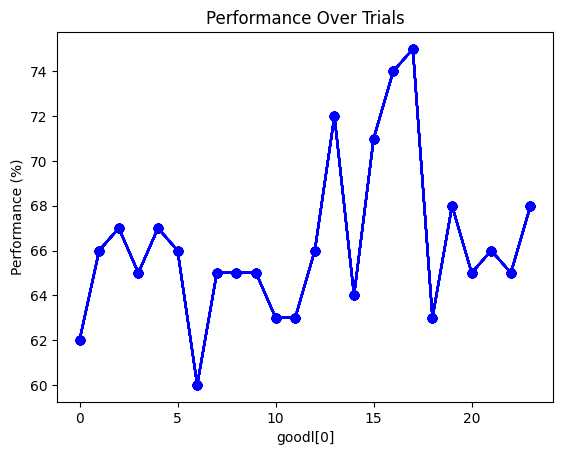

In [ ]:
import matplotlib.pyplot as plt
plt.figure()
for j in range(len(fooll)):


  # plt.plot(goodl[j])
   plt.plot(a,'-o',color='blue')
   plt.xlabel('goodl[0]')
   plt.ylabel('Performance (%)')
   plt.title('Performance Over Trials')
   plt.grid()
plt.show()

14.0
58.0
47.0
39.0
51.0
57.0
61.0
85.0
82.0


ValueError: 'x' and 'y' must have the same size

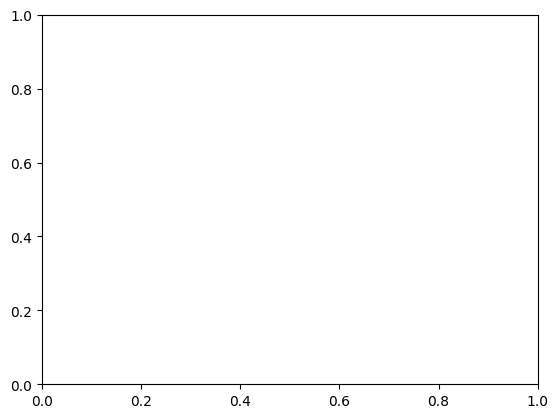

In [ ]:
from collections import deque
import random
import numpy as np
import matplotlib.pyplot as plt

baseline_it = random.uniform(0.0, 0.1)
mylist = []
performance_results = []
nr_fish_runs = 5
nr_trials = 50
rolling_window = deque(maxlen=10)
for run in range(1, nr_fish_runs + 1):
    trial_correctness_list = []
    performance_percent_list = []
    mylist = []  # Initialize an empty list to track correctness in each trial

    for _ in range(nr_trials):
        if len(mylist) > 0 and sum(mylist) / len(mylist) * 100 > 80:
         # performance_results.append(sum(mylist) / len(mylist))
          break


        fish = get_fish(fish_list, feature_name_list)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)
        response_value = 0
        correct_trials = 0
        mon.reset()
        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
            simulate(trial_duration)
            simulate(dopamine_input_duration)
            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)

            if response_value > response_threshold or feature_name == feature_order[-1]:
                baseline_it = 0.5
                simulate(deactivate_input_duration)

                category_selected = ["A", "B"][response_idx]

                if category_selected == category_true:
                    Reward_Layer.baseline = 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0
                    mylist.append(0)

                SNc.firing = 1
                SNc.firing = 0

                simulate(calcium_trace_decline_duration)

                performance_percent = sum(mylist[-10:]) / 10 * 100
                trial_correctness_list.append(performance_percent)

                if len(trial_correctness_list) % 10 == 0:  # Calculate average performance for every 10 trials
                    avg_performance_window = sum(trial_correctness_list[-10:]) / 10
                    print(avg_performance_window)
                    performance_percent_list.append(avg_performance_window)
                    mon.pause()

    performance_results.append(sum(mylist) / len(mylist))
                #mon.pause()
# Plotting the average performance for different runs
plt.errorbar(len(range(0, nr_fish_runs)),performance_results, yerr=np.std(performance_results), fmt='-o')
plt.xlabel('Run Number')
plt.ylabel('Average Performance')
plt.title('Average Performance for Different Runs with Error Bars')
plt.show()

In [ ]:
print(len(range(0, nr_fish_runs )))
print(performance_results)
len(range(0, nr_fish_runs ))

5
[1.0, 0.565, 1.0, 0.54, 0.875]


5

29.33946608946609
62.92038259298321
60.18698078166328
58.971673920661125
57.02475692027663
59.45765157359866
58.03652784000237
59.108463747541876
58.02106978545438
57.01238621141813
55.69007447481147
54.86288775010182
53.61017967232031
51.57500028756326
51.67015293888555
53.15508388886817
53.75442014629323
53.76472627973135


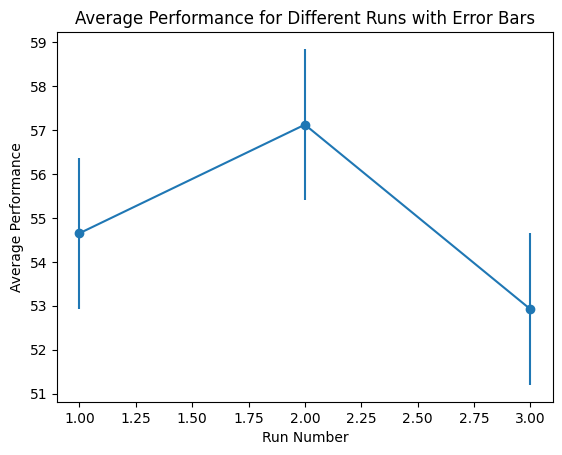

In [ ]:

from collections import deque
import random
import numpy as np
import matplotlib.pyplot as plt

def simulate_trials():
    average_performance = 0
    consecutive_correct = 0
    trial_correctness_list = []
    performance_percent = 0
    performance_list= []
    mylist=[]
    baseline_it = random.uniform(0.0, 0.1)
    nr_fish_runs = 3
    nr_trials = 60
    performance_results = []
    rolling_window = deque(maxlen=10)
    rolling_window2 = deque(maxlen=10)

    response_threshold=0.4
    for run in range(1, nr_fish_runs + 1):
        trial_correctness_list = []
        correct_trials = 0
        performance_percent_list = []

        for trial in range(1, nr_trials + 1):
            # Your existing trial loop code goes here
            mon.reset()
            fish = get_fish(fish_list, feature_name_list)
            feature_order = get_feature_order(feature_name_list)
            category_true = get_true_category(fish)
            response_value=0

            for feature_name in feature_order:
                mon.start()
                select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
                simulate(trial_duration)
                simulate(dopamine_input_duration)
                response_value = np.max(PM.r)
                response_idx = np.argmax(PM.r)
                #print(response_value)

                if response_value > response_threshold or feature_name == feature_order[-1]:
                    baseline_it=0.0
                    simulate(deactivate_input_duration)

                    category_selected = ["A", "B"][response_idx]
                # print(f"{fing}th fish is:\n{fish}")

                    if category_selected == category_true:
                        Reward_Layer.baseline = 1
                        consecutive_correct += 1
                        correct_trials += 1
                        mylist.append(1)

                    else:
                        Reward_Layer.baseline = 0
                        mylist.append(0)


                #simulate(dopamine_input_duration)
                    SNc.firing = 1
                    SNc.firing = 0

                    simulate(calcium_trace_decline_duration)
                    simulate(calcium_trace_decline_duration)
                    mon.pause()

                    perfor=(sum(mylist)/(len(mylist)+1))*100


                    trial_correctness_list.append(perfor)
                    if len(trial_correctness_list) % 10 == 0:  # Calculate average performance for every 10 trials
                        avg_performance_window = sum(trial_correctness_list[-10:]) / 10
                        print(avg_performance_window)


                       # print(avg_performance_window)
                        performance_percent_list.append(avg_performance_window)
        performance_results.append(sum(performance_percent_list) / len(performance_percent_list))

    # Plotting the average performance for different runs
    plt.errorbar(range(1, nr_fish_runs + 1), performance_results, yerr=np.std(performance_results), fmt='-o')
    plt.xlabel('Run Number')
    plt.ylabel('Average Performance')
    plt.title('Average Performance for Different Runs with Error Bars')
    plt.show()

simulate_trials()

In [ ]:
plt.plot(performance_results)

NameError: name 'plt' is not defined

In [ ]:
import torch
from torch import nn
import numpy as np
from collections import deque

# Define the response_threshold
response_threshold = 0.4
response_value = torch.tensor(np.random.rand(), requires_grad=True)  # Initialize response_value as a PyTorch tensor

# Define the loss function
def loss_function(output, target):
    return torch.abs(output - target)

# Define the model to optimize response_value
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.linear = nn.Linear(1, 1)

    def forward(self, x):
        return self.linear(x)

# Initialize the model
model = MyModel()

# Define the optimizer
optimizer = torch.optim.SGD([response_value], lr=0.01)

# Training loop
for _ in range(100):  # You can adjust the number of epochs
    optimizer.zero_grad()

    # Generate some random input data (not used in this case)
    input_data = torch.randn(1, 1)

    # Calculate response_value using PyTorch tensor
    target = torch.tensor(response_threshold)
    output = model(input_data)

    # Calculate loss
    loss = loss_function(response_value, target)

    # Backward pass and optimization
    loss.backward()
    optimizer.step()

    print(f'Response Value: {response_value.item()}, Loss: {loss.item()}')

# Retrieve the optimized response_value
optimized_response_value = response_value.item()

print(f'Optimized Response Value: {optimized_response_value}')

Response Value: 0.2586163282394409, Loss: 0.1513836681842804
Response Value: 0.26861631870269775, Loss: 0.14138367772102356
Response Value: 0.2786163091659546, Loss: 0.13138368725776672
Response Value: 0.2886162996292114, Loss: 0.12138369679450989
Response Value: 0.29861629009246826, Loss: 0.11138370633125305
Response Value: 0.3086162805557251, Loss: 0.10138371586799622
Response Value: 0.31861627101898193, Loss: 0.09138372540473938
Response Value: 0.32861626148223877, Loss: 0.08138373494148254
Response Value: 0.3386162519454956, Loss: 0.07138374447822571
Response Value: 0.34861624240875244, Loss: 0.06138375401496887
Response Value: 0.3586162328720093, Loss: 0.051383763551712036
Response Value: 0.3686162233352661, Loss: 0.0413837730884552
Response Value: 0.37861621379852295, Loss: 0.031383782625198364
Response Value: 0.3886162042617798, Loss: 0.02138379216194153
Response Value: 0.3986161947250366, Loss: 0.011383801698684692
Response Value: 0.40861618518829346, Loss: 0.001383811235427856

In [ ]:
baseline_it=0.009

def myfunction():
    from collections import deque
    import numpy as np

    averageperformance = 0
    consecutive_correct = 0
    trialcorrectnesslist = []
    performancepercent = 0
    perpi = []
    performancepercentlist = []
    response_threshold = 2.5
    trialduration = 200
    dopamine_input_duration = 300
    deactivate_input_duration = 30
    calcium_trace_decline_duration = 100
    nrfishpresentations = 100
    correct_trials = 0
    rollingwindow = deque(maxlen=20)
    mylist=[]
    for fing in range(nrfishpresentations):
        mon.reset()
        fish = get_fish(fish_list, feature_name_list)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)

        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
            simulate(trial_duration)
            simulate(dopamine_input_duration)
            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)

            if response_value > response_threshold or feature_name == feature_order[-1]:
                IT.baseline = baseline_it
                simulate(deactivate_input_duration)
                category_selected = ["A", "B"][response_idx]
                #print(response_value)

                if category_selected == category_true:
                    Reward_Layer.baseline = 1

                    consecutive_correct += 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0

                    simulate(dopamine_input_duration)
                    mylist.append(0)
                SNc.firing = 1
                SNc.firing = 0

                simulate(calcium_trace_decline_duration)

                #print(mylist)
                if fing>=1:
                    performance_percent = (sum(mylist)/ len(mylist)) * 100
                    rollingwindow.append(performance_percent)

                if len(rollingwindow) == 20:
                    avgperformancewindow = sum(rollingwindow) / len(rollingwindow)
                    performancepercentlist.append(avgperformancewindow)
                    print(avgperformancewindow)


                simulate(calcium_trace_decline_duration)
                mon.pause()
    return performancepercentlist
# Call the function to run the simulation

In [ ]:
goodl=[]
for j in range(2):
  mf=myfunction()
  goodl.append(mf)

34.75398238672233
37.0267096594496
39.41801400727569
41.91801400727569
43.51801400727569
45.376988366250046
46.726194715456394
47.52976614402782
48.06616461146077
48.8994979447941
49.984541933063895
50.869958599730566
51.441054170826135
51.88223064141438
52.4060401652239
52.82270683189057
53.307603493257815
53.702340335363075
54.154432103244325
54.654432103244325
55.07835777107243
55.5437257364404
55.94311906303292
56.284028153941996
56.46180593171979
56.595585195933836
56.58376486496458
56.717693436393134
56.714174787554285
56.58084145422096
56.42271368698503
56.24242522544656
56.19382602590397
56.030427333093506
55.991466294132465
55.931942484608655
55.988841488876076
55.938932232977706
55.915029581956425
55.99836291528976
55.9803701124109
56.064855519476964
56.05193562283614
55.945401531927054
55.936854523380035
55.83804029413102
55.83327687717325
55.81489452423208
55.88587943993749
56.04302229708035
56.18524820152665
56.31345332973176
56.42847012993853
56.62366532513372
56.80548350

[90, 90]


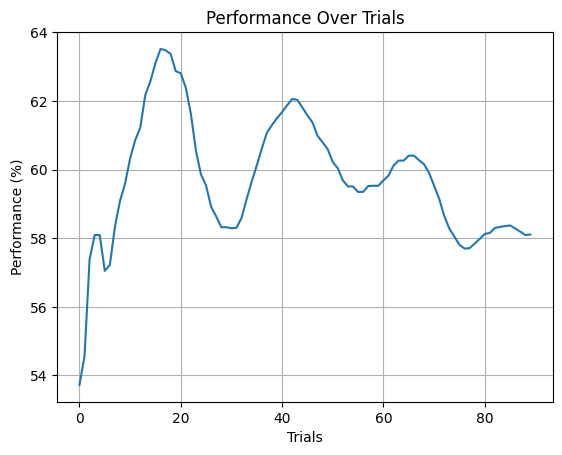

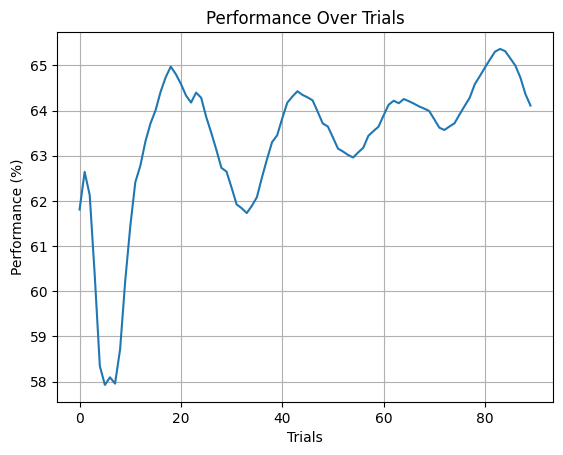

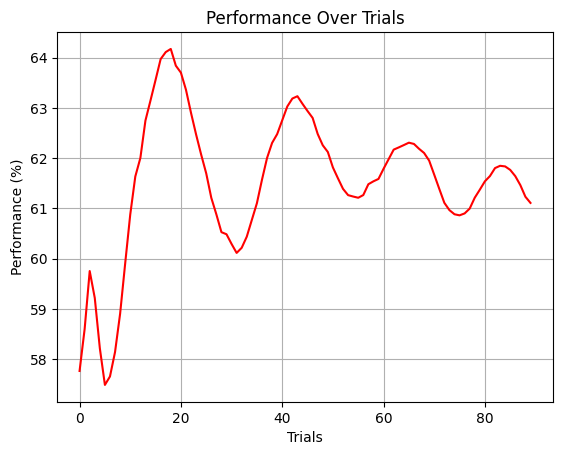

In [ ]:
print([len(goodl[j]) for j in range(len(goodl))])
#perpi.reverse()
import matplotlib.pyplot as plt

for j in range(len(goodl)):

   plt.figure()
   plt.plot(goodl[j])
   plt.xlabel('Trials')
   plt.ylabel('Performance (%)')
   plt.title('Performance Over Trials')
   plt.grid()
plt.show()

aveve=[]
tot=0
for l in range(90):
   aber=0
   for lst in goodl:
      aber+=lst[l]
   tot=aber/len(goodl)
   aveve.append(tot)

for j in range(1):
   plt.figure()
   plt.plot(aveve, color='red')
   plt.xlabel('Trials')
   plt.ylabel('Performance (%)')
   plt.title('Performance Over Trials')
   plt.grid()
plt.show()

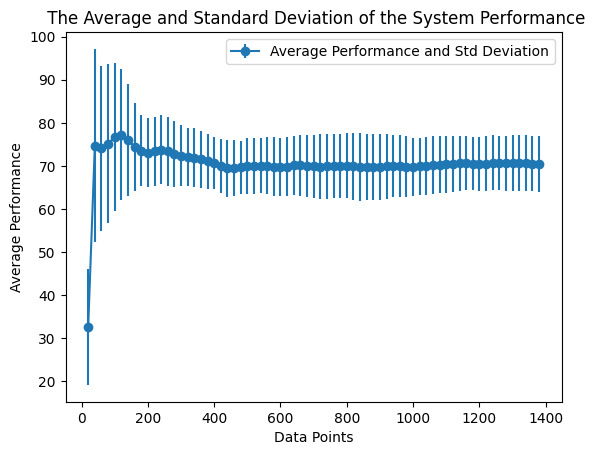

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



# Given list with three sublists
input_list = goodl

# Initialize an empty list to store averages
averages = []

least_square_errors = [np.mean([abs(run[j] - run[j - 1]) for j in range(1, len(run))]) for run in input_list]


# Iterate over the length of any sublist (assuming all sublists have the same length)
for i in range(0, len(input_list[0]), 10):
    total = 0
    for lst in input_list:
        total += np.mean(lst[i:i+10])  # Calculate average for each 10 points
    avg = total / len(input_list)
    averages.append(avg)
mean_performances = np.mean(input_list[0], axis=0)
# Calculate standard deviation
std_deviation = [np.std([np.mean(lst[j:j+10]) for lst in input_list]) for j in range(0, len(input_list[0]), 10)]

# Plot the data
x = np.arange(10, len(averages)*20 + 10, 20)
#plt.plot(x,averages, label='Average', color='red')
#plt.plot(x, input_list[0], label='Curve 1', color='green')
#plt.plot(np.arange(len(input_list[1])), input_list[1], label='Curve 2', color='blue')
#plt.plot(np.arange(len(input_list[2])), input_list[2], label='Curve 2', color='red')
plt.errorbar(np.arange(20, len(averages)*20 + 20, 20), averages, yerr=std_deviation, linestyle='-', marker='o', label='Average Performance and Std Deviation')


plt.xlabel('Data Points')
plt.ylabel('Average Performance')
plt.title(' The Average and Standard Deviation of the System Performance')
plt.legend()
plt.show()

[0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0, 90.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 99.0, 99.0, 97.18181818181819, 97.18181818181819, 94.68181818181819, 94.68181818181819, 92.18181818181819, 92.18181818181819, 89.87412587412588, 89.87412587412588, 87.73126873126873, 87.73126873126873, 85.73126873126873, 85.73126873126873, 83.73126873126873, 83.73126873126873, 81.85626873126873, 81.85626873126873, 79.50332755479815, 79.50332755479815, 77.72554977702036, 77.72554977702036, 76.7659538174244, 76.7659538174244, 76.63437487005596, 76.63437487005596, 76.13437487005596, 76.13437487005596, 75.10873384441496, 75.10873384441496, 73.91825765393875, 73.91825765393875, 72.28189401757513, 72.28189401757513, 70.36885053931425, 70.36885053931425, 68.49385053931425, 68.49385053931425, 67.09679171578485, 67.09679171578485, 65.87456949356263, 65.87456949356263, 64.80619342518656, 64.80619342518656, 63.73406866885127, 63.73406866885127, 63.03036496514757, 63.03036496514757, 62.79226972705

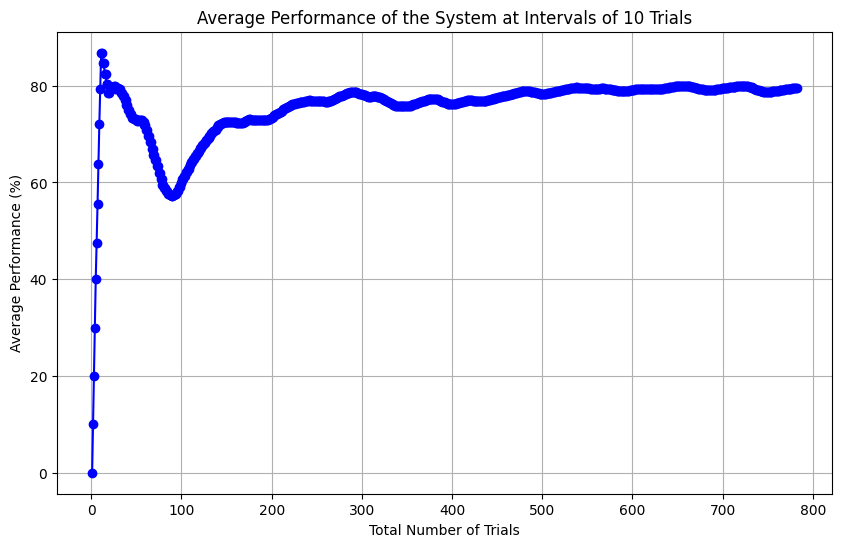

In [ ]:
print(performance_percent_list)

import matplotlib.pyplot as plt

data_points = range(1, (len(goodl[-1]) * 1) + 1, 1)

plt.figure(figsize=(10, 6))
plt.plot(data_points,goodl[-1][0:800], marker='o', color='b', linestyle='-')
plt.xlabel('Total Number of Trials')
plt.ylabel('Average Performance (%)')
plt.title('Average Performance of the System at Intervals of 10 Trials')
plt.grid(True)
plt.show()

In [ ]:

#all_runs_std.append(std_list)  # Append instead of extend to


# Calculate mean performances and standard deviation
mean_performances = np.mean(goodl[3], axis=0)
#mean_std = np.mean(all_runs_std, axis=0)

# Calculate least square errors
least_square_errors = [np.mean([abs(run[j] - run[j - 1]) for j in range(1, len(run))]) for run in goodl]

# Flatten the std deviations for error bar
#mean_std = np.array(mean_std).flatten()

plt.figure(figsize=(10, 6))
plt.errorbar(
    np.arange(10, len(averages)*10 + 10, 10),
    mean_performances,
    yerr=np.std(goodl, axis=0),  # Calculate standard deviation on all runs
    linestyle='-',
    marker='o',
    label='Average Performance and Std Deviation'
)
plt.xlabel('Trial')
plt.ylabel('Average Performance')
plt.title('Average Performance and Standard Deviation with Least Square Error')
plt.legend()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (6,) + inhomogeneous part.

<Figure size 1000x600 with 0 Axes>

In [ ]:
from collections import deque
import numpy as np

average_performance = 0
consecutive_correct = 0
trial_correctness_list = []
performance_percent = 0
mylist = []
perpi = []
performance_percent_list = []
response_threshold = 0.7
trial_duration = 200
dopamine_input_duration = 300
deactivate_input_duration = 30
calcium_trace_decline_duration = 100
nr_fish_presentations = 100
correct_trials = 0  # Initialize the count of correct trials
rolling_window = deque(maxlen=10)  # Define a deque with a maximum length of 10 for the rolling window
baseline_it=np.random.uniform(0,0.1)
for fing in range(nr_fish_presentations):
    mon.reset()
    fish = get_fish(fish_list, feature_name_list)
    feature_order = get_feature_order(feature_name_list)
    category_true = get_true_category(fish)

    for feature_name in feature_order:
        mon.start()
        select_input(feature_name, fish, IT, feature_name_list, baseline_it)
        simulate(trial_duration)

        response_value = np.max(PM.r)
        response_idx = np.argmax(PM.r)

        if response_value > response_threshold or feature_name == feature_order[-1]:
            IT.baseline = baseline_it
            simulate(deactivate_input_duration)

            category_selected = ["A", "B"][response_idx]

            if category_selected == category_true:
                Reward_Layer.baseline = 1
                SNc.firing = 1
                consecutive_correct += 1
                correct_trials += 1
                mylist.append(1)
            else:
                Reward_Layer.baseline = 0
                SNc.firing = 0
                consecutive_correct += 0
                SNc.firing = 0
                mylist.append(0)
        if fing>=1:
            performance_percent = (sum(mylist)/len(mylist)) * 100
            rolling_window.append(performance_percent)


            if len(rolling_window) == 10:
                avg_performance_window = performance_percent
                perpi.append(avg_performance_window)
                print(avg_performance_window)

        simulate(dopamine_input_duration)
        simulate(calcium_trace_decline_duration)
        mon.pause()
print(rolling_window)

33.33333333333333
42.857142857142854
50.0
50.0
55.55555555555556
60.0
63.63636363636363
63.63636363636363
63.63636363636363
66.66666666666666
69.23076923076923
69.23076923076923
69.23076923076923
64.28571428571429
60.0
60.0
60.0
62.5
64.70588235294117
64.70588235294117
64.70588235294117
61.111111111111114
57.89473684210527
57.89473684210527
57.89473684210527
57.89473684210527
55.00000000000001
55.00000000000001
55.00000000000001
52.38095238095239
50.0
50.0
50.0
50.0
52.17391304347826
52.17391304347826
52.17391304347826
52.17391304347826
50.0
50.0
50.0
50.0
48.0
48.0
46.15384615384615
46.15384615384615
44.44444444444444
44.44444444444444
44.44444444444444
44.44444444444444
46.42857142857143
46.42857142857143
46.42857142857143
46.42857142857143
44.827586206896555
44.827586206896555
46.666666666666664
48.38709677419355
50.0
50.0
48.484848484848484
47.05882352941176
45.714285714285715
45.714285714285715
45.714285714285715
45.714285714285715
44.44444444444444
44.44444444444444
45.9459459459

In [ ]:
print(sum(rolling_window)/len(rolling_window))
print(consecutive_correct)

53.19636316882266
53


In [ ]:
all_runs_performances = []
all_runs_std = []
std_list=[]
tlist=[]

In [ ]:
from collections import deque
std=0
baseline_it = random.uniform(0.0, 0.6)
average_performance = 0
consecutive_correct = 0
trial_correctness_list = []
performance_percent = 0
mylist = []
perpi = []
performance_percent_list = []
response_threshold = 0.03
trial_duration = 200
dopamine_input_duration = 300
deactivate_input_duration = 30
calcium_trace_decline_duration = 100
nr_fish_presentations = 200
correct_trials = 0
rolling_window = deque(maxlen=10)



for fing in range(nr_fish_presentations):
    mon.reset()
    fish = get_fish(fish_list, feature_name_list)
    feature_order = get_feature_order(feature_name_list)
    category_true = get_true_category(fish)

    for feature_name in feature_order:
        mon.start()
        select_input(feature_name, fish, MTL, feature_name_list, 0)
        simulate(trial_duration)

        response_value = np.max(PM.r)

        response_idx = np.argmax(PM.r)

        print(response_value)
        if response_value > response_threshold or feature_name == feature_order[-1]:
            IT.baseline = baseline_it
            simulate(deactivate_input_duration)

            category_selected = ["A", "B"][response_idx]

            if category_selected == category_true:
                Reward_Layer.baseline = 1
                SNc.firing = 1
                consecutive_correct += 1
                correct_trials += 1
                mylist.append(1)
            else:
                Reward_Layer.baseline = 0
                SNc.firing = 0
                mylist.append(0)
            simulate(dopamine_input_duration)
            simulate(calcium_trace_decline_duration)
            mon.pause()
            if fing>=1:
                performance_percent = (sum(mylist)/ len(mylist )) * 100
                rolling_window.append(performance_percent)

                if len(rolling_window)==10:
               # print(rolling_window)
                   average_performance = (sum(rolling_window)/10)
                   avg_performance_window = average_performance
                   perpi.append(avg_performance_window)
                   print(f"Average Performance at step {fing + 1}: {average_performance:.2f}%")
                   std = np.std(perpi[fing-10:fing])
                   std_list.append(std)
                   all_runs_performances.append(perpi)
                   all_runs_std.append(std)
    if fing >= 100 and average_performance == 90.00:
        break

0.011302875373761564
0.028685499136251357
0.049308177738021944
0.038961545264750375
0.006637873259215503
0.016295131739950574
0.01635808500011602
0.013822831667491344
0.012678839549905214
0.027165946567022085
0.02513739553297586
0.02119502715313309
0.0064798391197310725
0.010709450870067605
0.009175747975596615
0.007720179154151736
0.006592807907849367
0.016023094523425027
0.016087636068939606
0.013622392442506891
0.006424062557715456
0.010058388809295955
0.008500089818781543
0.007208913683666496
0.006423643402868595
0.014055983827688818
0.013174219713732466
0.011145459427236406
0.009700004098023705
0.01878282636392183
0.01615743224461011
0.013758815218843552
0.012359510380471716
0.02536304949979221
0.022443229977028703
0.018858139755688428
0.006310575702407591
0.011858041318909171
0.0102486740041067
0.008753800496252894
0.010749844859783681
0.020322136852258404
0.01737876773109722
0.01476285794770009
Average Performance at step 11: 33.60%
0.006214524019342382
0.009008754071489636
0.00

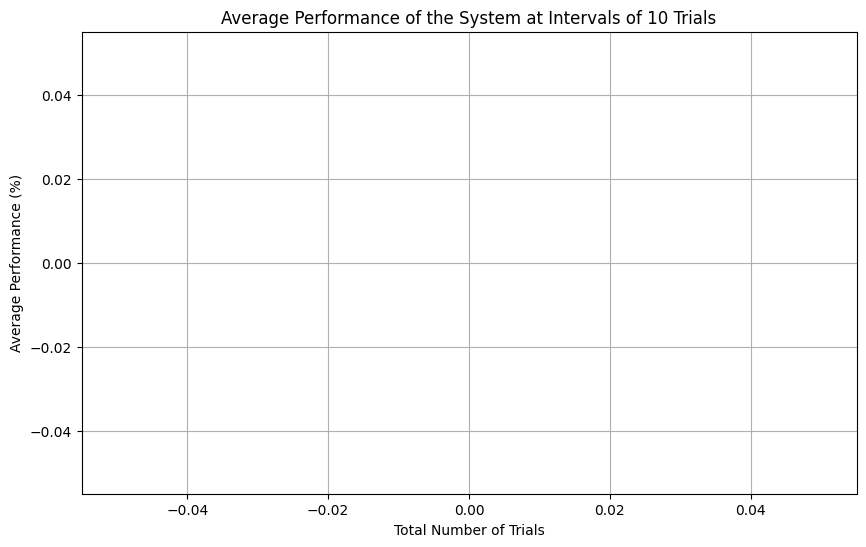

In [ ]:
import matplotlib.pyplot as plt

data_points = range(1, (len(perpi) * 1) + 1, 1)

plt.figure(figsize=(10, 6))
plt.plot(data_points, perpi, marker='o', color='b', linestyle='-')
plt.xlabel('Total Number of Trials')
plt.ylabel('Average Performance (%)')
plt.title('Average Performance of the System at Intervals of 10 Trials')
plt.grid(True)
plt.show()

In [ ]:
all_runs_performances.append(perpi)

tlist.append(perpi)
all_runs_std.append(std)
print(len(tlist))

1


In [ ]:

# Calculate mean performances and standard deviation
mean_performances = np.mean(all_runs_performances, axis=0)
mean_std = np.mean(all_runs_std, axis=0)





# Calculate least square errors
least_square_errors = [np.mean([abs(run[j] - run[j - 1]) for j in range(1, len(run))]) for run in all_runs_performances]

# Flatten the std deviations for error bar
data_points=np.arange(10, len(mean_performances)*10 + 10, 10)
plt.figure(figsize=(10, 6))
plt.plot(data_points, perpi, marker='o', color='r', linestyle='-')

plt.errorbar(
    #data_points,
    np.arange(10, len(mean_performances)*10 + 10, 10),
    mean_performances,
    yerr=np.std(all_runs_performances, axis=0),  # Calculate standard deviation on all runs
    linestyle='-',
    marker='o',
    label='Average Performance and Std Deviation'
)
plt.xlabel('Trial')
plt.ylabel('Average Performance')
plt.title('Average Performance and Standard Deviation with Least Square Error')
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'all_runs_std' is not defined

In [ ]:

from collections import deque
import numpy as np
import matplotlib.pyplot as plt

def simulate_fish_detection(i):
    average_performance = 0
    consecutive_correct = 0
    trial_correctness_list = []
    performance_percent = 0
    mylist = []
    perpi = []
    performance_percent_list = []
    response_threshold = 0.2
    trial_duration = 200
    dopamine_input_duration = 300
    deactivate_input_duration = 30
    calcium_trace_decline_duration = 100
    correct_trials = 0
    rolling_window = deque(maxlen=10)
    nr_fish_presentations=100
    for fing in range(nr_fish_presentations):
        mon.reset()
        fish = get_fish(fish_list, feature_name_list,i)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)

        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
            simulate(trial_duration)

            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)

            if response_value > response_threshold or feature_name == feature_order[-1]:
                IT.baseline = baseline_it
                simulate(deactivate_input_duration)

                category_selected = ["A", "B"][response_idx]

                if category_selected == category_true:
                    Reward_Layer.baseline = 1
                    SNc.firing = 1
                    consecutive_correct += 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0
                    SNc.firing = 0
                    mylist.append(0)
                simulate(dopamine_input_duration)
                simulate(calcium_trace_decline_duration)
                mon.pause()

                performance_percent = (correct_trials / len(mylist)) * 100
                performance_percent_list.append(performance_percent)

            if fing >= 10:
                average_performance = sum(performance_percent_list[fing-10:fing]) / 10
                perpi.append(average_performance)
                print(f"Average Performance at step {fing + 1}: {average_performance:.2f}%")

            if average_performance == 80.00:
                break

    return perpi

Average Performance at step 10: 64.33% with Standard Deviation: 20.33
Average Performance at step 20: 50.08% with Standard Deviation: 6.60
Average Performance at step 30: 52.47% with Standard Deviation: 2.54
Average Performance at step 40: 53.30% with Standard Deviation: 1.82
Average Performance at step 50: 49.54% with Standard Deviation: 1.63
Average Performance at step 60: 48.25% with Standard Deviation: 0.91
Average Performance at step 70: 47.76% with Standard Deviation: 0.77
Average Performance at step 80: 49.10% with Standard Deviation: 1.21
Average Performance at step 90: 52.03% with Standard Deviation: 0.66
Average Performance at step 100: 51.33% with Standard Deviation: 0.65
Average Performance at step 110: 49.48% with Standard Deviation: 0.45
Average Performance at step 120: 48.84% with Standard Deviation: 0.37
Average Performance at step 130: 48.68% with Standard Deviation: 0.26
Average Performance at step 140: 47.69% with Standard Deviation: 0.58
Average Performance at step 

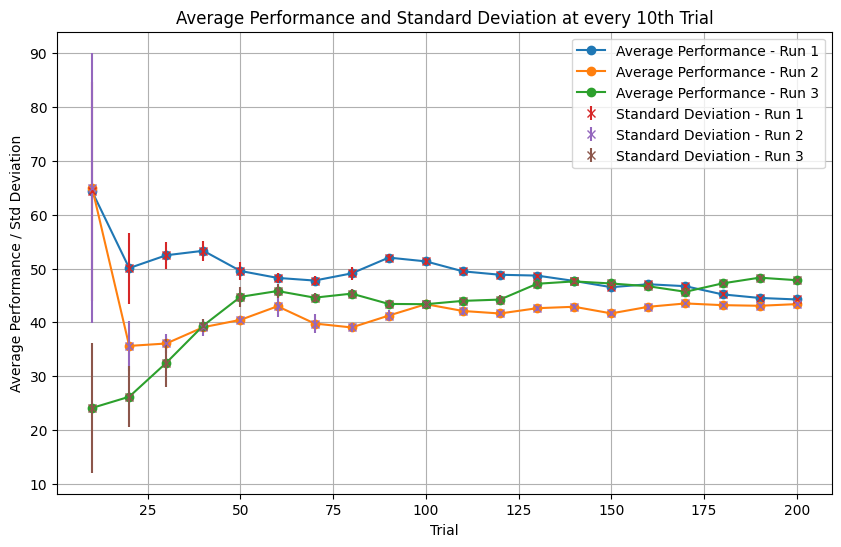

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


TypeError: object of type 'numpy.float64' has no len()

<Figure size 1000x600 with 0 Axes>

In [ ]:
from collections import deque
import numpy as np
import matplotlib.pyplot as plt

def simulate_fish_detection(nr_fish_presentations=200):
    average_performance = 0
    performance_percent_list = []
    perpi = []  # Average performance list
    std_list = []  # Standard deviation list
    response_threshold = 0.48
    trial_duration = 200
    dopamine_input_duration = 300
    deactivate_input_duration = 30
    calcium_trace_decline_duration = 100
    correct_trials = 0
    consecutive_correct=0
    mylist=[]
    for fing in range(1, nr_fish_presentations + 1):
        # Simulation code (not changed for brevity)
        mon.reset()
        fish = get_fish(fish_list, feature_name_list)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)

        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, IT, feature_name_list, baseline_it)
            simulate(trial_duration)

            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)

            if response_value > response_threshold or feature_name == feature_order[-1]:
                IT.baseline = baseline_it
                simulate(deactivate_input_duration)

                category_selected = ["A", "B"][response_idx]

                if category_selected == category_true:
                    Reward_Layer.baseline = 1
                    SNc.firing = 1
                    consecutive_correct += 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0
                    SNc.firing = 0
                    mylist.append(0)
                    correct_trials += 0
                simulate(dopamine_input_duration)
                simulate(calcium_trace_decline_duration)
                mon.pause()

        performance_percent = (correct_trials / fing+0) * 100
        performance_percent_list.append(performance_percent)

        if fing >= 10 and fing % 10 == 0:
            average_performance = sum(performance_percent_list[-10:]) / len(performance_percent_list[-10:])
            perpi.append(average_performance)
            std = np.std(performance_percent_list[-10:])
            std_list.append(std)

            print(f"Average Performance at step {fing}: {average_performance:.2f}% with Standard Deviation: {std:.2f}")

            if average_performance == 80.00:
                break

    return perpi, std_list

# Perform 5 runs and calculate average performance and standard deviation
average_performances_list = []
standard_deviations_list = []

for i in range(3):
    perpi, std_list = simulate_fish_detection()
    average_performances_list.append(perpi)
    standard_deviations_list.append(std_list)

# Plot Average Performance and Standard Deviation at every tenth trial
plt.figure(figsize=(10, 6))
for run_idx, run in enumerate(average_performances_list):
    plt.plot(np.arange(10, len(run)*10 + 10, 10), run, marker='o', label=f'Average Performance - Run {run_idx+1}')

for std_idx, std in enumerate(standard_deviations_list):
    plt.errorbar(np.arange(10, len(std)*10 + 10, 10), average_performances_list[std_idx], yerr=std, linestyle='None', marker='x', label=f'Standard Deviation - Run {std_idx+1}')

plt.xlabel('Trial')
plt.ylabel('Average Performance / Std Deviation')
plt.title('Average Performance and Standard Deviation at every 10th Trial')
plt.legend()
plt.grid(True)
plt.show()

all_runs_performances = []
all_runs_std = []


# Calculate the mean performance across runs
mean_performances = np.mean(all_runs_performances, axis=0)
mean_std = np.mean(all_runs_std, axis=0)

# Calculate the least square error
least_square_errors = [np.mean([abs(run[j] - run[j-1]) for j in range(1, len(run))]) for run in all_runs_performances]

# Plot the Average Performance with Standard Deviation and Least Square Error
plt.figure(figsize=(10, 6))

# Plot the average performance with error bars for standard deviation
plt.errorbar(np.arange(10, len(mean_performances)*10 + 10, 10), mean_performances, yerr=mean_std, linestyle='-', marker='o', label='Average Performance and Std Deviation')

plt.xlabel('Trial')
plt.ylabel('Average Performance')
plt.title('Average Performance and Standard Deviation with Least Square Error')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from collections import deque
import numpy as np
import matplotlib.pyplot as plt

def simulate_fish_detection1(i):
    performance_percent_list = []
from collections import deque
import numpy as np
import matplotlib.pyplot as plt

def simulate_fish_detection(nr_fish_presentations=200):
    average_performance = 0
    performance_percent_list = []
    perpi = []  # Average performance list
    std_list = []  # Standard deviation list
    response_threshold = 0.48
    trial_duration = 200
    dopamine_input_duration = 300
    deactivate_input_duration = 30
    calcium_trace_decline_duration = 100
    correct_trials = 0
    consecutive_correct=0
    mylist=[]
    for fing in range(1, nr_fish_presentations + 1):
        # Simulation code (not changed for brevity)
        mon.reset()
        fish = get_fish(fish_list, feature_name_list)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)

        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, IT, feature_name_list, baseline_it)
            simulate(trial_duration)

            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)

            if response_value > response_threshold or feature_name == feature_order[-1]:
                IT.baseline = baseline_it
                simulate(deactivate_input_duration)

                category_selected = ["A", "B"][response_idx]

                if category_selected == category_true:
                    Reward_Layer.baseline = 1
                    SNc.firing = 1
                    consecutive_correct += 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0
                    SNc.firing = 0
                    mylist.append(0)
                    correct_trials += 0
                simulate(dopamine_input_duration)
                simulate(calcium_trace_decline_duration)
                mon.pause()

        performance_percent = (correct_trials / len(mylist)) * 100
        performance_percent_list.append(performance_percent)

        if fing >= 10 and fing % 10 == 0:
            average_performance = sum(performance_percent_list[-10:]) / len(performance_percent_list[-10:])
            perpi.append(average_performance)
            std = np.std(performance_percent_list[-10:])
            std_list.append(std)

            print(f"Average Performance at step {fing+10}: {average_performance:.2f}% with Standard Deviation: {std:.2f}")

            if average_performance == 80.00:
                break


    return perpi

In [ ]:

from collections import deque
import numpy as np
import matplotlib.pyplot as plt


def simulate_fish_detection(nr_fish_presentations=50):
    performance_percent_list = []
    perpi = []
    baseline_mtl = random.uniform(0.0, 0.1)

    std_list = []
    response_threshold = 0.2
    trial_duration = 200
    dopamine_input_duration = 300
    deactivate_input_duration = 30
    calcium_trace_decline_duration = 100
    correct_trials = 0
    rollingwindow = deque(maxlen=10)
    mylist = []
    ps=0
    avgperformancewindow=0
    baseline_mtl=0
    for fing in range(1, nr_fish_presentations + 1):
        chunk_consecutive_correct = 0
        chunk_data = []

        # Placeholder code - Functions to be defined
        fish = get_fish(fish_list, feature_name_list)
        feature_order = get_feature_order(feature_name_list)
        category_true = get_true_category(fish)
        category_selected = ""

        for feature_name in feature_order:
            mon.start()
            select_input(feature_name, fish, MTL, feature_name_list, baseline_it)
            simulate(trial_duration)

            response_value = np.max(PM.r)
            response_idx = np.argmax(PM.r)
            if response_value > response_threshold or feature_name == feature_order[-1]:
                IT.baseline = baseline_it
                simulate(deactivate_input_duration)
                category_selected = ["A", "B"][response_idx]
                #print(response_value)
                if category_selected == category_true:
                    chunk_consecutive_correct += 1
                    Reward_Layer.baseline = 1
                    SNc.firing = 1
                    correct_trials += 1
                    mylist.append(1)
                else:
                    Reward_Layer.baseline = 0
                    SNc.firing = 0
                    mylist.append(0)
                simulate(dopamine_input_duration)

                chunk_data.append({
                'category_true': category_true,
                'category_selected': category_selected,
                'fish_features': fish,
                'correctness': category_selected == category_true
                 })

                performance_percent =  (sum(mylist)/ len(mylist)) * 100
                rollingwindow.append(performance_percent)
        if len(rollingwindow) == 10:



                avgperformancewindow = sum(rollingwindow)/len(rollingwindow)
                performance_percent_list.append(avgperformancewindow)

                #mylist.append(correct_trials)
        if len(mylist)>=10:
                ps = (sum(performance_percent_list) / len(performance_percent_list))
               # ps=performance_percent_list[-1]
        else:
                ps = 0
        print(ps,avgperformancewindow)
       # perpi=performance_percent_list
        perpi.append(ps)
        std = np.std(perpi[-10:fing])
        std_list.append(std)
      #  performance_percent = (correct_trials / fing+1) * 100
      #  performance_percent_list.append(performance_percent)
        print(performance_percent,avgperformancewindow)
    return perpi, std_list

all_runs_performances = []
all_runs_std = []

for i in range(4):
    perpi, std_list = simulate_fish_detection()
    all_runs_performances.append(perpi)
    all_runs_std.append(std_list)  # Append instead of extend to


# Calculate mean performances and standard deviation
mean_performances = np.mean(all_runs_performances, axis=0)
mean_std = np.mean(all_runs_std, axis=0)

# Calculate least square errors
least_square_errors = [np.mean([abs(run[j] - run[j - 1]) for j in range(1, len(run))]) for run in all_runs_performances]

# Flatten the std deviations for error bar
mean_std = np.array(mean_std).flatten()

plt.figure(figsize=(10, 6))
plt.errorbar(
    np.arange(10, len(mean_performances)*10 + 10, 10),
    mean_performances,
    yerr=np.std(all_runs_performances, axis=0),  # Calculate standard deviation on all runs
    linestyle='-',
    marker='o',
    label='Average Performance and Std Deviation'
)
plt.xlabel('Trial')
plt.ylabel('Average Performance')
plt.title('Average Performance and Standard Deviation with Least Square Error')
plt.legend()

In [ ]:
print(correct_trials)

35


In [ ]:

def get_fish(fish_list, feature_name_list,i):
    """
    return a dictionary with features and feature values

    Args:
        fish_list: list
            list with all possible fishes consisting of 4 feature values
        feature_name_list: list
            list containing 4 strings, the names of the 4 features (the order corresponds to the order in fish_list)
    """
    input_1=1
    input_11=i
   # input_11 = random.randint(0, i)
    # print(input_1)
  #  input_11 = random.randint(
   #     0, 5
 #   )  # -oliver-: why only 0,2 fish_list has 6 entries --> 0,5
    # print(input_11)
    # input_111 = random.randrange(0, 3, 1)  # --feature selection  -oliver-: input_111 not used
    # print(input_111)  # --feature selected
    input_sacc = fish_list[input_1][input_11]
    # print(input_sacc)
    fish = dict(zip(feature_name_list, input_sacc))
    return fish

NameError: name 'simulate_fish_detection1' is not defined

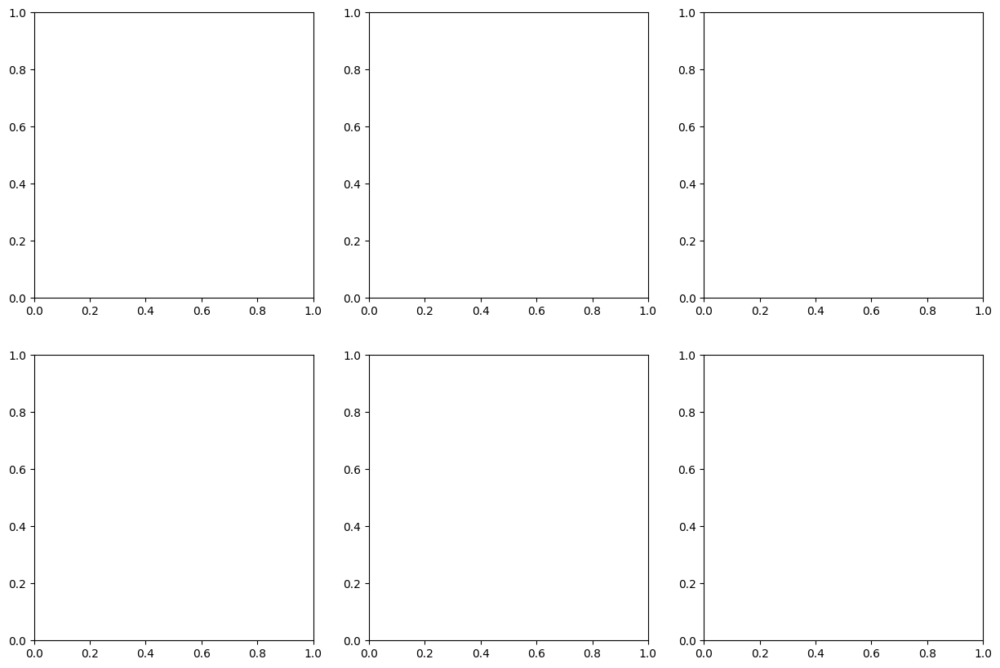

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i in range(6):
  #  print(fish)
    avg=simulate_fish_detection1(i)
    exes = axes[i//3, i%3]
    # Assuming this is an existing function to get some data for plotting
    exes.plot(avg)
    exes.set_xlabel('Total Number of Trials')
    exes.set_ylabel('Average Performance (Correct Trials / Total Trials)')
    exes.set_title(f"Average Performance for {fish_list[0][i]}")
    exes.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
avg

[0,
 0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 100.0]

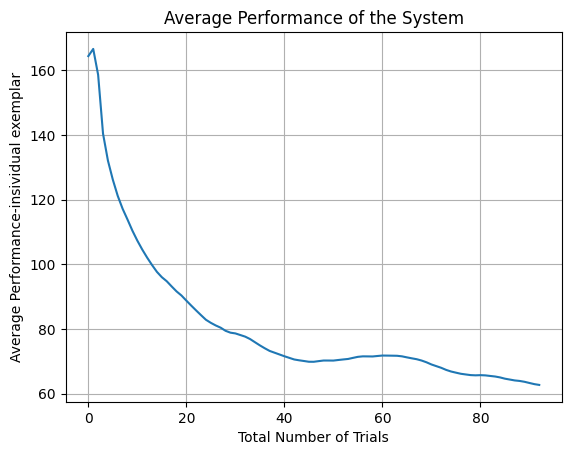

In [ ]:
plt.plot(av)
plt.xlabel('Total Number of Trials')
plt.ylabel('Average Performance-insividual exemplar')
plt.title('Average Performance of the System')
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
from collections import deque

poose = []
consecutive_correct = 0
trial_correctness_list = []
mylist = []
response_threshold =0.5
trial_duration = 200
dopamine_input_duration = 300
deactivate_input_duration = 30
calcium_trace_decline_duration = 100
nr_fish_presentations = 200
chunk_size = 10  # Define the chunk size
correct_trials = 0
avgperformancewindow = 0
rollingwindow = deque(maxlen=10)
performancepercentlist = []

for _ in range(nr_fish_presentations):
    chunk_consecutive_correct = 0  # Track consecutive correct in chunk
    chunk_data = []  # Store chunk data for figures

    fish = get_fish(fish_list, feature_name_list)
    feature_order = get_feature_order(feature_name_list)
    category_true = get_true_category(fish)

    for feature_name in feature_order:
        # Your previous code
        mon.start()
        select_input(feature_name, fish, IT, feature_name_list, baseline_it)
        simulate(trial_duration)

        response_value = np.max(PM.r)
        response_idx = np.argmax(PM.r)
        if response_value > response_threshold or feature_name == feature_order[-1]:

            IT.baseline = baseline_it
            simulate(deactivate_input_duration)
            category_selected = ["A", "B"][response_idx]  # Your previous code
            print(response_value)
            if category_selected == category_true:
                chunk_consecutive_correct += 1
                Reward_Layer.baseline = 1
                SNc.firing = 1

                trial_correctness_list.append(1)
                correct_trials += 1
            else:
                Reward_Layer.baseline = 0
                trial_correctness_list.append(0)
                SNc.firing = 0

            # Your previous code
            simulate(dopamine_input_duration)
            performance_percent = (correct_trials / (_ + 1)) * 100
            rollingwindow.append(performance_percent)
            chunk_data.append({
                'category_true': category_true,
                'category_selected': category_selected,
                'fish_features': fish,
                'correctness': category_selected == category_true
            })

            break

            consecutive_correct += chunk_consecutive_correct

    if len(rollingwindow) == 10:
        avgperformancewindow = (correct_trials/ len(rollingwindow))*10
        performancepercentlist.append(avgperformancewindow)

    mylist.append(correct_trials)
    if len(mylist) > 0:
       # ps = sum(mylist) / len(mylist)
        ps=sum(trial_correctness_list)/len(trial_correctness_list)

    else:
        ps = 0
    poose.append(ps)

print("Consecutive Correct:", consecutive_correct)
print("Category True of First Fish:", chunk_data[0]['category_true'])

0.6858369910885369
0.8752293889109858
1.0283556486525194
1.1319042317337293
1.2036571517854628
1.2606132461636983
1.316469628113413
1.3458011329871962
1.2549199477368937
1.1648300472391655
1.140834397597517
1.151317921450227
1.1561460029804171
1.1524760701700496
1.0291256564344948
0.6871530465498688
0.27547323291812903
0.5607098021588084
0.7280095022285281
0.8651075954050339
0.9938956771287507
1.0859927252626418
1.1763911591608869
1.3418748528669249
1.3973727994146792
1.416932590487561
1.4180235924192428
1.4011453647526382
1.4779200219456954
1.461134044060836
1.4404149550207448
1.3895850174788922
1.363092130534387
1.3105105293508925
1.297034904222242
1.3930924881841744
1.412963937559502
1.4030359125250071
1.4590568880538628
1.3403553114543891


In [ ]:
print (sum(trial_correctness_list)/len(trial_correctness_list))
print(correct_trials)

NameError: name 'trial_correctness_list' is not defined

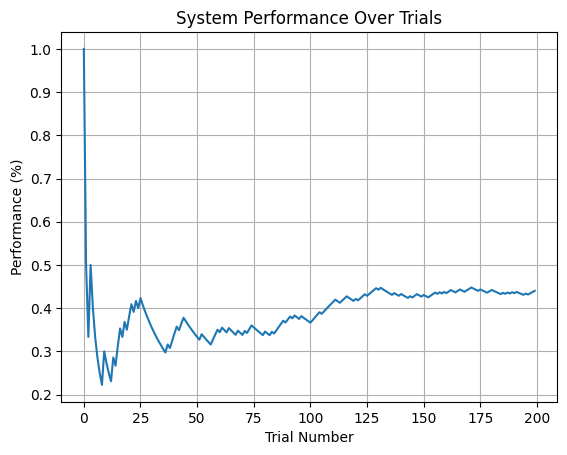

[1.0, 0.5, 0.3333333333333333, 0.5, 0.4, 0.3333333333333333, 0.2857142857142857, 0.25, 0.2222222222222222, 0.3, 0.2727272727272727, 0.25, 0.23076923076923078, 0.2857142857142857, 0.26666666666666666, 0.3125, 0.35294117647058826, 0.3333333333333333, 0.3684210526315789, 0.35, 0.38095238095238093, 0.4090909090909091, 0.391304347826087, 0.4166666666666667, 0.4, 0.4230769230769231, 0.4074074074074074, 0.39285714285714285, 0.3793103448275862, 0.36666666666666664, 0.3548387096774194, 0.34375, 0.3333333333333333, 0.3235294117647059, 0.3142857142857143, 0.3055555555555556, 0.2972972972972973, 0.3157894736842105, 0.3076923076923077, 0.325, 0.34146341463414637, 0.35714285714285715, 0.3488372093023256, 0.36363636363636365, 0.37777777777777777, 0.3695652173913043, 0.3617021276595745, 0.3541666666666667, 0.3469387755102041, 0.34, 0.3333333333333333, 0.3269230769230769, 0.33962264150943394, 0.3333333333333333, 0.32727272727272727, 0.32142857142857145, 0.3157894736842105, 0.3275862068965517, 0.3389830

In [ ]:

plt.plot(poose)
plt.xlabel('Trial Number')
plt.ylabel('Performance (%)')
plt.title('System Performance Over Trials')
plt.grid()
plt.show()
print(poose)

In [ ]:
recordings=mon.get_recordings()
recording_times=mon.get_recording_times()

In [ ]:

    chunklist=[]
    chlist=[]
    poplist=[p for p in populations]
    recordings_list = [recordings]
    for all_times_idx, all_times in enumerate(
        [recording_times.all()]
    ):
        print(f"recordings{all_times_idx+1}")
        for chunk in range(len(all_times)):
            print(f"\tchunk: {chunk}")
            chlist.append(chunk)
            for pop_name in poplist:
                print(f"\t\tpop_name: {pop_name}")
                print(
                    f"\t\trecording_array_size: {recordings_list[all_times_idx][chunk][f'{pop_name};r'].shape}"
                )
                for time_point in ["start", "stop"]:
                    print(f"\t\t\ttime_point: {time_point}")
                    for unit in ["ms", "idx"]:
                        print(f"\t\t\t\tunit: {unit}")
                        for period in range(
                            len(all_times[chunk][pop_name][time_point][unit])
                        ):
                            print(
                                f"\t\t\t\t\tperiod {period}: {all_times[chunk][pop_name][time_point][unit][period]}"

                            )
                            chunklist.append(all_times[chunk][pop_name][time_point][unit][period])
print(chunklist)
print(chlist)

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
		recording_array_size: (2830, 2)
			time_point: start
				unit: ms
					period 0: 0.0
					period 1: 700.0
					period 2: 1400.0
					period 3: 2100.0
				unit: idx
					period 0: 0
					period 1: 700
					period 2: 1400
					period 3: 2100
			time_point: stop
				unit: ms
					period 0: 699.0
					period 1: 1399.0
					period 2: 2099.0
					period 3: 2829.0
				unit: idx
					period 0: 699
					period 1: 1399
					period 2: 2099
					period 3: 2829
	chunk: 448
		pop_name: IT
		recording_array_size: (2830, 144)
			time_point: start
				unit: ms
					period 0: 0.0
					period 1: 700.0
					period 2: 1400.0
					period 3: 2100.0
				unit: idx
					period 0: 0
					period 1: 700
					period 2: 1400
					period 3: 2100
			time_point: stop
				unit: ms
					period 0: 699.0
					period 1: 1399.0
					period 2: 2099.0
					period 3: 2829.0
				unit: idx
					period 0: 699
					period 1: 1399
					period 2: 2099
					period 3:

KeyboardInterrupt: 

Generate fig monitor_recordings_1_chunk0.png... Done

0
Generate fig monitor_recordings_1_chunk1.png... Done

1
Generate fig monitor_recordings_1_chunk2.png... Done

2
Generate fig monitor_recordings_1_chunk3.png... 

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

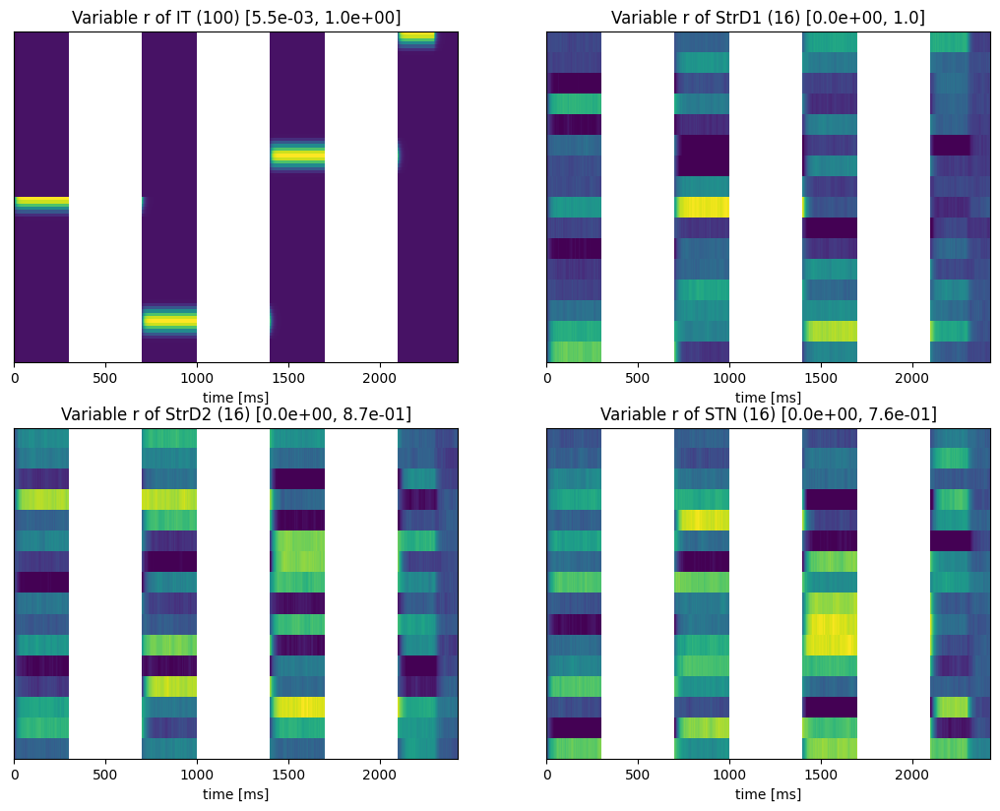

In [ ]:
for chunk in range(len(recordings)):
        ### using plot_recordings which plots the recordings of one chunk
        PlotRecordings(
            figname=f"monitor_recordings_1_chunk{chunk}.png",
            recordings=recordings,
            #recording_times=recording_times,
            recording_times=recording_times,
            shape=(2,2),
            plan={
                "position": [1,2,3,4],
                "compartment": ["IT", "StrD1","StrD2","STN"],
                "variable": ["r", "r", "r","r"],
                "format": ["matrix", "matrix", "matrix", "matrix"],
            },
            chunk=chunk,

        )
        plt.savefig(f"pw3{chunk}.png")
        print(chunk)

Generate fig second-monitor_recordings_1_chunk0.png... Done

0
Generate fig second-monitor_recordings_1_chunk1.png... Done

1
Generate fig second-monitor_recordings_1_chunk2.png... 

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

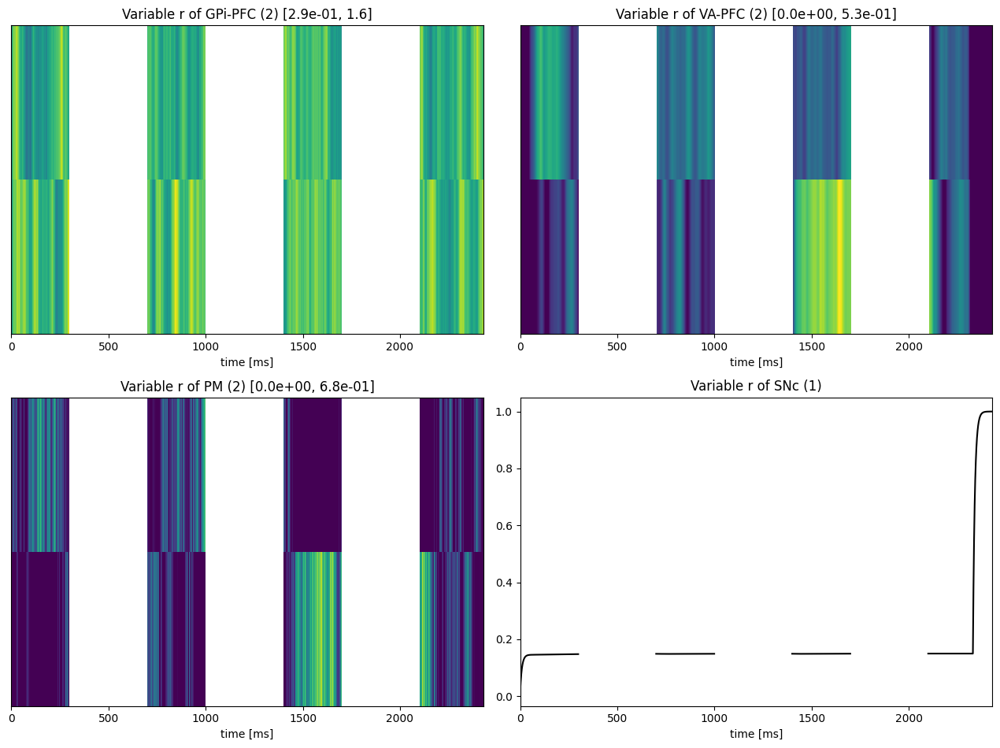

In [ ]:
for chunk in range(len(recordings)):
        ### using plot_recordings which plots the recordings of one chunk
        PlotRecordings(
            figname=f"second-monitor_recordings_1_chunk{chunk}.png",
            recordings=recordings,
            #recording_times=recording_times,
            recording_times=recording_times,
            shape=(2,2),
            plan={
                "position": [1,2,3,4],
                "compartment": ["GPi-PFC", "VA-PFC","PM", "SNc"],
                "variable": ["r", "r", "r","r"],
                "format": ["matrix", "matrix", "matrix", "line"],
            },
            chunk=chunk,

        )
        plt.savefig(f"pw3{chunk}.png")
        print(chunk)

In [ ]:
for x in recordings:
   # x[mon_dict]
    plot_list = [f"{idx + 1};{pop};r;matrix" for idx,
                 pop in enumerate(populations)]


    plotl = [x[m] for m in my]
   # print(x['IT;r'])
print(plot_list[0])
pp = [l for l in plotl]
a=mon.recording_times
print(a[0]['IT']['start']['ms'])
temp=[int(d) for d in a[0]['IT']['start']['ms']]
print(temp)
x=recordings
print(x[4]['IT;r'])

NameError: name 'my' is not defined

In [ ]:

for x in recordings:
    plot_list = [f"{idx + 1};{pop};r;matrix" for idx, pop in enumerate(populations)]
   # print(plot_list)
   # print(populations)
    #print(x)
    print(x['IT;r'])
    dno=x['VA-PFC;r']
    dls=[f"{p};r" for p in populations]
    dls=[x[p] for p in my]
   # print(dls)
    for s in populations:
        d=x[f"{s};r"]
        import numpy as np
        np.savetxt('data{}.csv'.format(s),d, delimiter=',')

[[0.00557801 0.00557801 0.00557801 ... 0.00557801 0.00557801 0.00557801]
 [0.01059821 0.01059821 0.01059821 ... 0.01059821 0.01059821 0.01059821]
 [0.0151164  0.0151164  0.0151164  ... 0.0151164  0.0151164  0.0151164 ]
 ...
 [0.05578006 0.05578006 0.05578006 ... 0.05578006 0.05578006 0.05578006]
 [0.05578006 0.05578006 0.05578006 ... 0.05578006 0.05578006 0.05578006]
 [0.05578006 0.05578006 0.05578006 ... 0.05578006 0.05578006 0.05578006]]


[[0.01821662 0.01821662 0.01821662 ... 0.01821662 0.01821662 0.01821662]
 [0.03461157 0.03461157 0.03461157 ... 0.03461157 0.03461157 0.03461157]
 [0.04936703 0.04936703 0.04936703 ... 0.04936703 0.04936703 0.04936703]
 ...
 [0.18216617 0.18216617 0.18216617 ... 0.18216617 0.18216617 0.18216617]
 [0.18216617 0.18216617 0.18216617 ... 0.18216617 0.18216617 0.18216617]
 [0.18216617 0.18216617 0.18216617 ... 0.18216617 0.18216617 0.18216617]]


<Axes: >

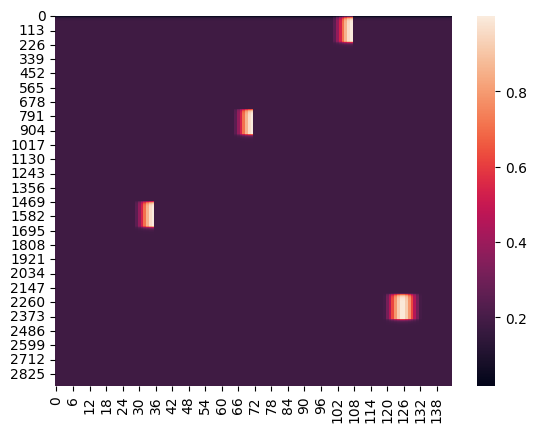

In [ ]:
print(x[4]['IT;r'])
import seaborn as sns
sns.heatmap(x[4]['IT;r'])

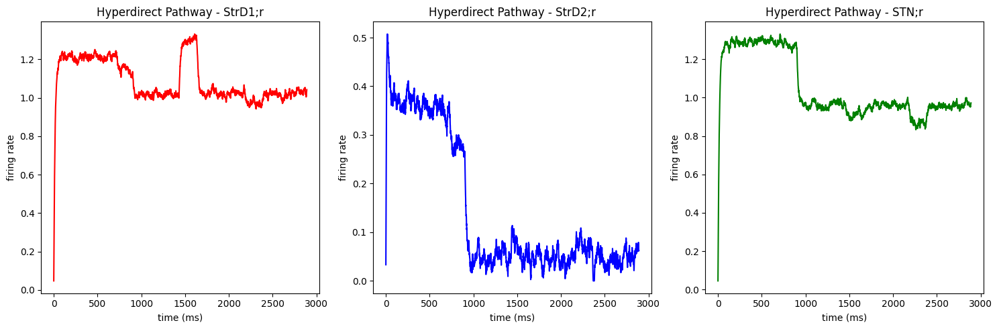

In [ ]:
import matplotlib.pyplot as plt
import numpy as np



# Create a figure with three subplots
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Plot data for each pathway on a different axis
ax[0].plot(x[1]['StrD1;r'][:,1], color='r')
ax[0].set_xlabel('time (ms)')
ax[0].set_ylabel('firing rate')
ax[0].set_title('Hyperdirect Pathway - StrD1;r')

ax[1].plot(x[1]['StrD2;r'][:,1], color='b')
ax[1].set_xlabel('time (ms)')
ax[1].set_ylabel('firing rate')
ax[1].set_title('Hyperdirect Pathway - StrD2;r')

ax[2].plot(x[1]['STN;r'][:,1], color='g')
ax[2].set_xlabel('time (ms)')
ax[2].set_ylabel('firing rate')
ax[2].set_title('Hyperdirect Pathway - STN;r')

plt.tight_layout()
plt.show()

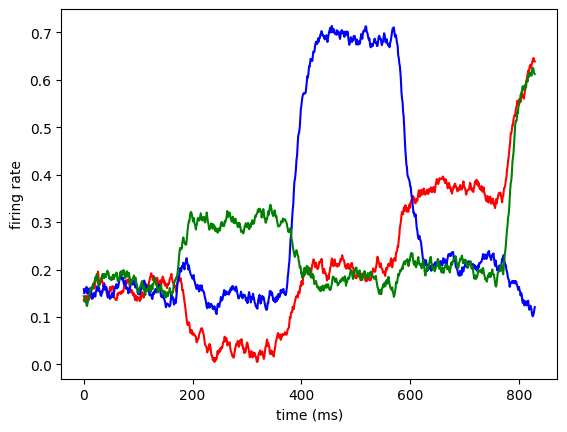

In [ ]:
import matplotlib.pyplot as plt

plt.plot(x['StrD1;r'][4350:5180][:,0],color='r')
plt.plot(x['STN;r'][4350:5180][:,0],color='b')
plt.plot(x['StrD2;r'][4350:5180][:,0],color='g')
plt.xlabel('time (ms)')
plt.ylabel('firing rate')
plt.label=('Hyperdirect Pathway')
plt.xlim=np.arange(14680,13450)

<Axes: >

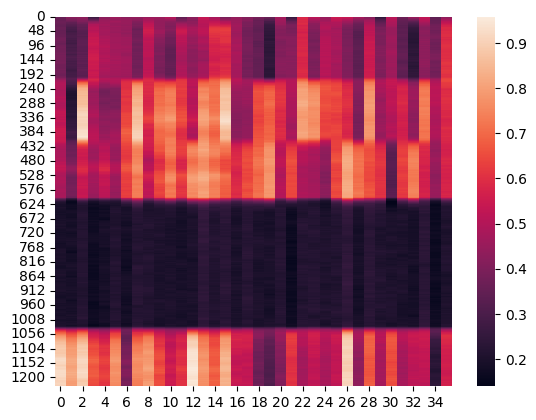

In [ ]:
import seaborn as sns

sns.heatmap(x['PFC_MTL;r'][4720:5950])

[[0.         0.        ]
 [0.00673732 0.        ]
 [0.         0.        ]
 ...
 [0.13580198 0.        ]
 [0.12658707 0.        ]
 [0.1899402  0.        ]]


<Axes: >

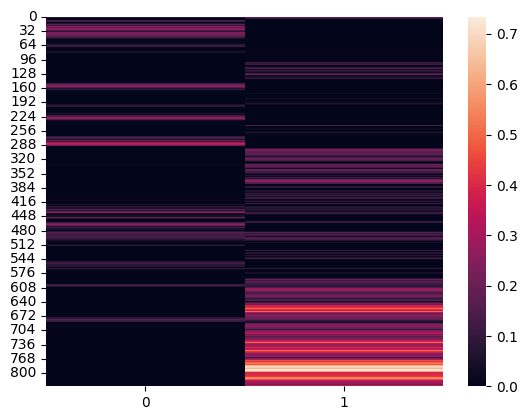

In [ ]:
print(x['PM;r'])
import seaborn as sns
sns.heatmap(x['PM;r'][4350:5180])



In [ ]:
import pandas as pd
import seaborn as sns
data_top =dno
print(data_top)
df = pd.read_csv('dataGPe.csv')
print(df[4350:5180])
x=df['1.494106053670226364e-01']
y=df['7.958343068463433201e-02']
sns.kdeplot(df)
#sns.heatmap(df)
g = sns.JointGrid(data=df[13450:14680], x="1.494106053670226364e-01", y="7.958343068463433201e-02", marginal_ticks=True)
#g.ax_joint.set(yscale="log")
cax = g.figure.add_axes([.15, .55, .02, .2])
g.plot_joint(sns.histplot, discrete=(True, False),cmap="light:#03012d", pmax=.8, cbar=True, cbar_ax=cax)
g.plot_marginals(sns.histplot, element="step", color="#03012d")

[[0. 0.]
 [0. 0.]
 [0. 0.]
 ...
 [0. 0.]
 [0. 0.]
 [0. 0.]]
      2.334570455350529899e-02  1.975807740435767956e-01
4350                  0.752384                  0.880076
4351                  0.670023                  0.921625
4352                  0.753955                  0.969836
4353                  0.694975                  0.954261
4354                  0.735925                  0.965344
...                        ...                       ...
5175                  0.713376                  0.307023
5176                  0.648787                  0.359334
5177                  0.637814                  0.411650
5178                  0.735272                  0.441070
5179                  0.715209                  0.547883

[830 rows x 2 columns]


KeyError: ignored

In [ ]:
for idx in range(nr_fish_presentations):

    plot_recordings(
    figname=f"test_plots/new_structure3/fish_presentation_{idx}.png",
    recordings=recordings,
    recording_times=recording_times,
    chunk=0,
    shape=(2, 4),
    plan=plot_list,
    #time_lim=recording_times.time_lims(chunk=0, period=idx),
    dpi=300)

generate fig test_plots/new_structure3/fish_presentation_0.png... 

Process Process-5:
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/CompNeuroPy/analysis_functions.py", line 838, in _plot_recordings
    actual_period = recordings[f"{compartment};period"]
KeyError: 'Reward_Layer;period'


NameError: name 'quit' is not defined

Generate fig monitor_recordings_1_chunk0.png... Done

0
Generate fig monitor_recordings_1_chunk1.png... Done

1
Generate fig monitor_recordings_1_chunk2.png... Done

2
Generate fig monitor_recordings_1_chunk3.png... Done

3
Generate fig monitor_recordings_1_chunk4.png... Done

4
Generate fig monitor_recordings_1_chunk5.png... Done

5
Generate fig monitor_recordings_1_chunk6.png... Done

6
Generate fig monitor_recordings_1_chunk7.png... Done

7
Generate fig monitor_recordings_1_chunk8.png... Done

8
Generate fig monitor_recordings_1_chunk9.png... Done

9
Generate fig monitor_recordings_1_chunk10.png... Done

10
Generate fig monitor_recordings_1_chunk11.png... Done

11
Generate fig monitor_recordings_1_chunk12.png... Done

12
Generate fig monitor_recordings_1_chunk13.png... Done

13
Generate fig monitor_recordings_1_chunk14.png... Done

14
Generate fig monitor_recordings_1_chunk15.png... Done

15
Generate fig monitor_recordings_1_chunk16.png... Done

16
Generate fig monitor_recordings_1_

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

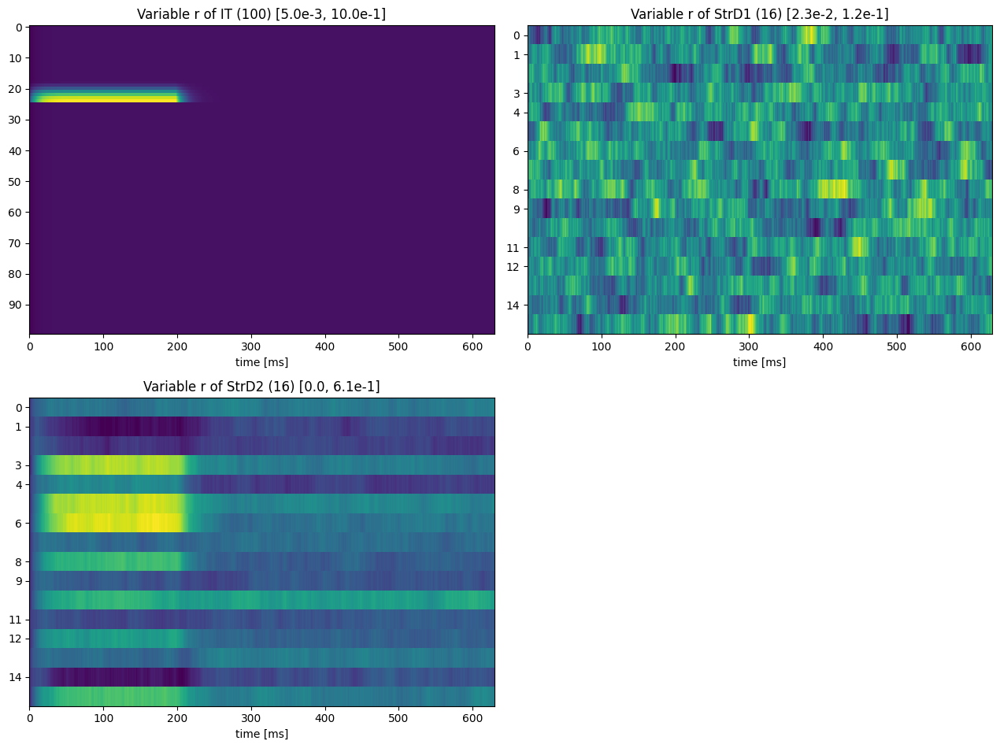

In [ ]:
for chunk in range(len(recordings)):
        ### using plot_recordings which plots the recordings of one chunk
        PlotRecordings(
            figname=f"monitor_recordings_1_chunk{chunk}.png",
            recordings=recordings,
            #recording_times=recording_times,
            recording_times=recording_times,
            shape=(2,2),
            plan={
                "position": [1,2,3],
                "compartment": ["IT", "StrD1","StrD2"],
                "variable": ["r", "r", "r"],
                "format": ["matrix", "matrix", "matrix"],
            },
            chunk=chunk,

        )
        plt.savefig(f"pw3{chunk}.png")
        print(chunk)

{'IT;period': 1.0, 'IT;r': array([[0.00307324, 0.00307324, 0.00307324, ..., 0.00307324, 0.00307324,
        0.00307324],
       [0.00583916, 0.00583916, 0.00583916, ..., 0.00583916, 0.00583916,
        0.00583916],
       [0.00832849, 0.00832849, 0.00832849, ..., 0.00832849, 0.00832849,
        0.00832849],
       ...,
       [0.03073245, 0.03073245, 0.03073245, ..., 0.03073245, 0.03073245,
        0.03073245],
       [0.03073245, 0.03073245, 0.03073245, ..., 0.03073245, 0.03073245,
        0.03073245],
       [0.03073245, 0.03073245, 0.03073245, ..., 0.03073245, 0.03073245,
        0.03073245]]), 'Reward_Layer;period': 1.0, 'Reward_Layer;r': array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]]), 'PFC_MTL;period': 1.0, 'PFC_MTL;r': array([[0.        , 0.00055393, 0.        , ..., 0.        , 0.00365687,
        0.        ],
       [0.02611157, 0.02934904, 0.02315592, ..., 0.02150398, 0.02231057,
        0.02370325],
       [0.07145192, 0.07273745, 0

<ipython-input-18-068d9ebab3e2>:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax=plt.subplots()


21
23600 hast: 24830
22
24830 hast: 26060
23
26060 hast: 26690
24
26690 hast: 27920
25
27920 hast: 29150
26
29150 hast: 29980
27
29980 hast: 31210
28
31210 hast: 32440
29
32440 hast: 33670
30
33670 hast: 34300
31
34300 hast: 35530
32
35530 hast: 36160
33
36160 hast: 37390
34
37390 hast: 38620
35
38620 hast: 39850
36
39850 hast: 41080
37
41080 hast: 42310
38
42310 hast: 43540
39
43540 hast: 44370
40
44370 hast: 45600
41
45600 hast: 46830
42
46830 hast: 48060
43
48060 hast: 49290
44
49290 hast: 50520
45
50520 hast: 51750
46
51750 hast: 52980
47
52980 hast: 54210
48
54210 hast: 55440
49
55440 hast: 56670
50
56670 hast: 57900
51
57900 hast: 59130
52
59130 hast: 59960
53
59960 hast: 61190
54
61190 hast: 62020
55
62020 hast: 63050
56
63050 hast: 64280
57
64280 hast: 64910
58
64910 hast: 65540
59
65540 hast: 66570
60
66570 hast: 67200
61
67200 hast: 68230
62
68230 hast: 69060
63
69060 hast: 69690
64
69690 hast: 70920
65
70920 hast: 72150
66
72150 hast: 73380
67
73380 hast: 74410
68
74410 hast

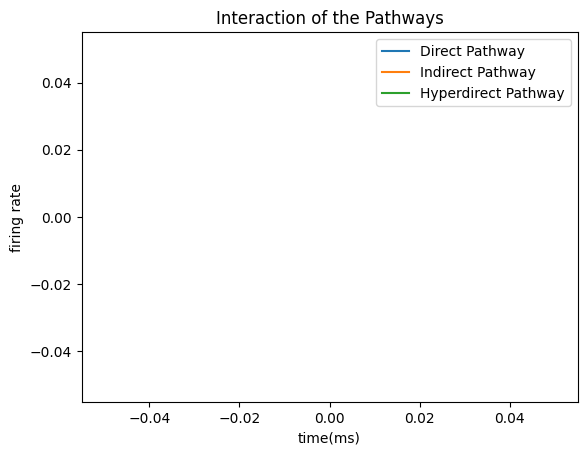

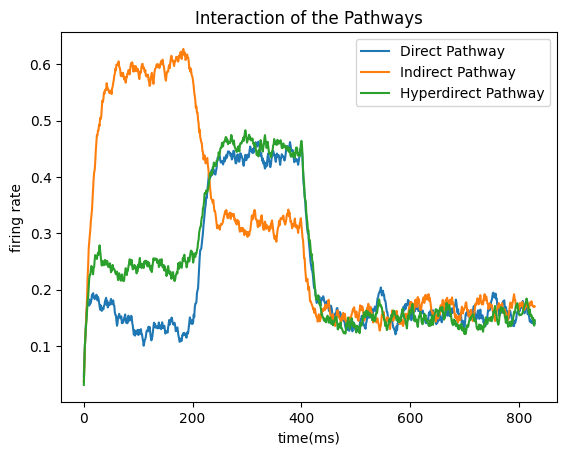

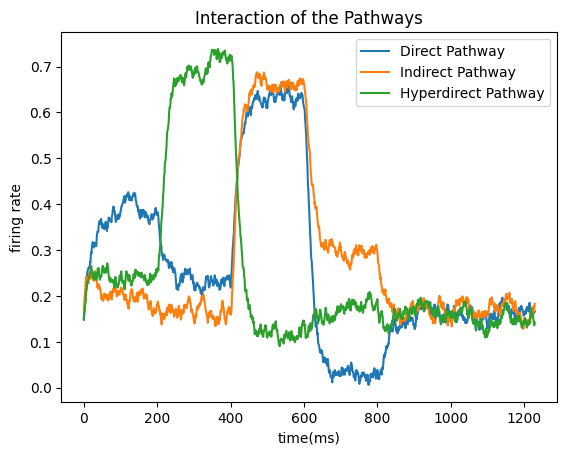

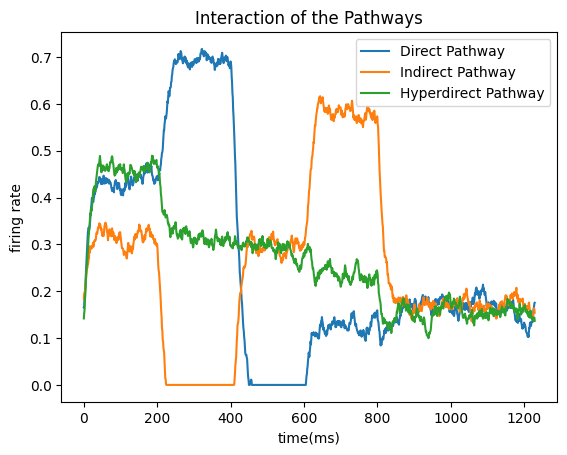

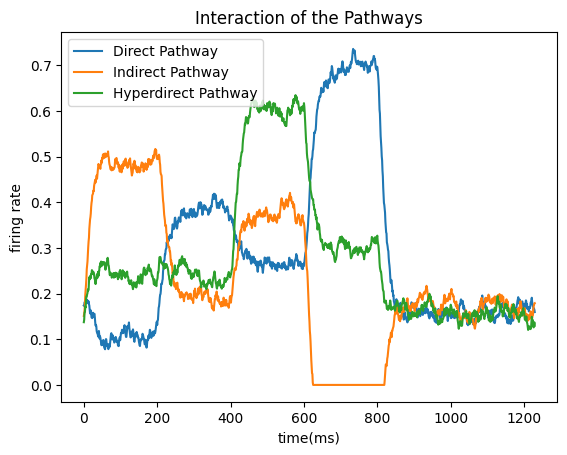

...

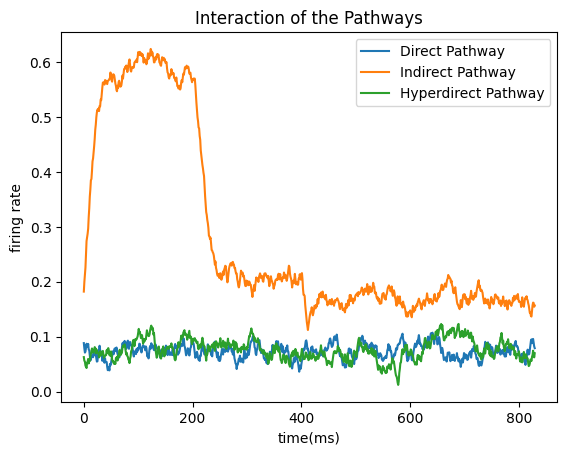

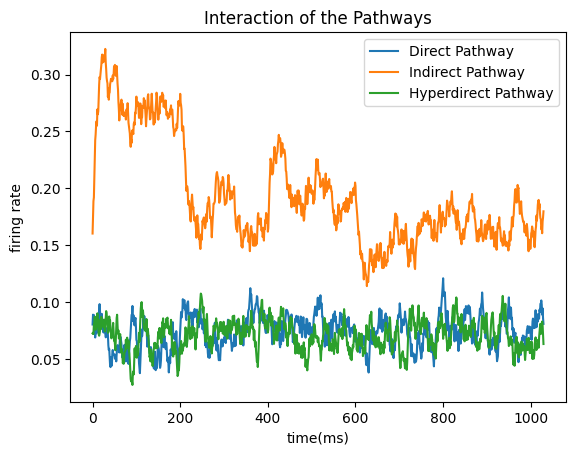

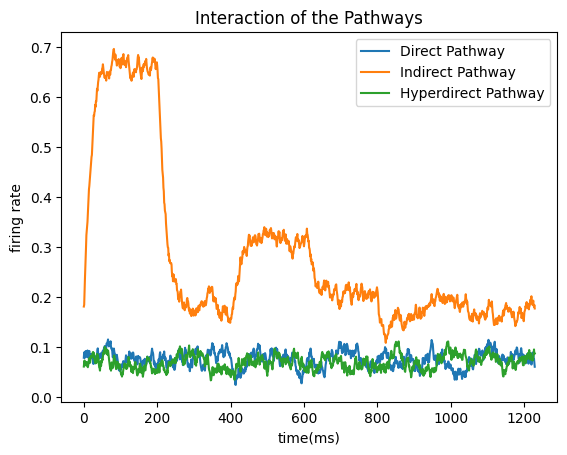

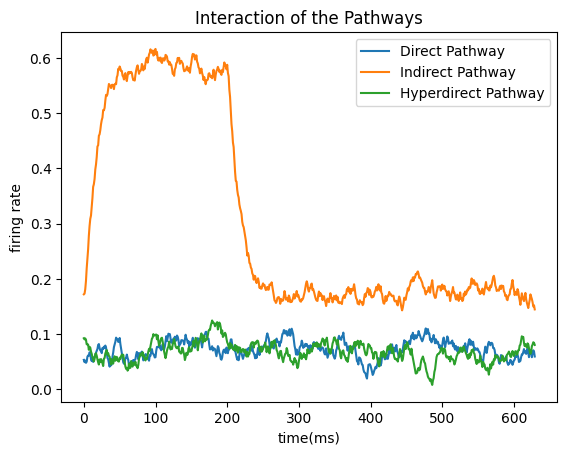

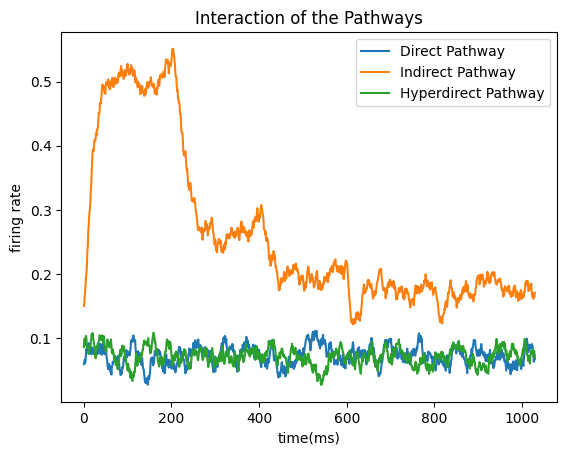

In [ ]:
for x in recordings:
  print(x)
lst=mon.timings['StrD1']
lst1=lst['start']
resul = [int(item) for item in lst1]
#print(resul)
#plt.plot(x['StrD1;r'][0:1230][:,0],color='b')


index = 0            # Python's indexing starts at zero
num = []
dum = []
for index, item in enumerate(resul, start=0):   # default is zero
  #  print(index, item)
   # print(resul[index])
    #i=resul[index]
    print(index)
    num.append(index)
    dum.append(index)
    num.append(item)
    rs=resul[index-1]
    rz=resul[index]
    print(rs,"hast:",rz)
    fig, ax=plt.subplots()
    ax=ax
    ax.plot(x['StrD1;r'][rs:rz][:,0],label='Direct Pathway')
    ax.plot(x['StrD2;r'][rs:rz][:,0],label='Indirect Pathway')
    ax.plot(x['STN;r'][rs:rz][:,0],label='Hyperdirect Pathway')
    cmap = plt.get_cmap('plasma')
    ax.set(title='Interaction of the Pathways',xlabel='time(ms)',ylabel='firing rate')
    ax.legend()
    plt.savefig(f"interact_{index}.png")

In [ ]:
for idx, item in enumerate(num) :
    plt.plot(x['StrD1;r'][idx:idx+1],label='Direct Pathway')
    plt.plot(x['StrD2;r'][idx:idx+1],label='Indirect Pathway')
    plt.plot(x['STN;r'][idx:idx+1],label='Hyperdirect Pathway')
    cmap = plt.get_cmap('plasma')
    plt.title('Interaction of the Pathways')
    plt.xlabel('time(ms)')
    plt.xlabel('firing rate')
    plt.legend()

    plt.savefig(f"pw3{idx}.png")
    plt.close()

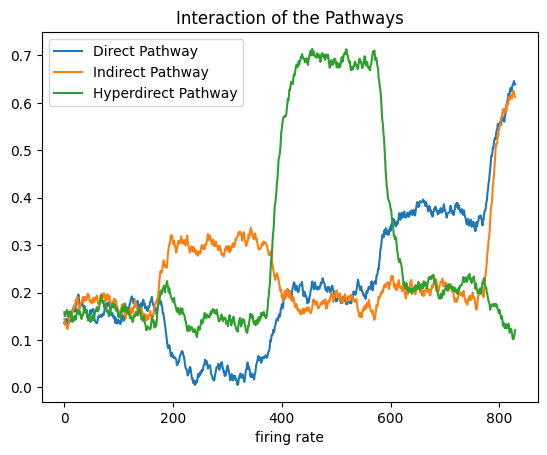

In [ ]:
plt.plot(x['StrD1;r'][4350:5180][:,0],label='Direct Pathway')
plt.plot(x['StrD2;r'][4350:5180][:,0],label='Indirect Pathway')
plt.plot(x['STN;r'][4350:5180][:,0],label='Hyperdirect Pathway')
cmap = plt.get_cmap('plasma')
plt.title('Interaction of the Pathways')
plt.xlabel('time(ms)')
plt.xlabel('firing rate')
plt.legend()

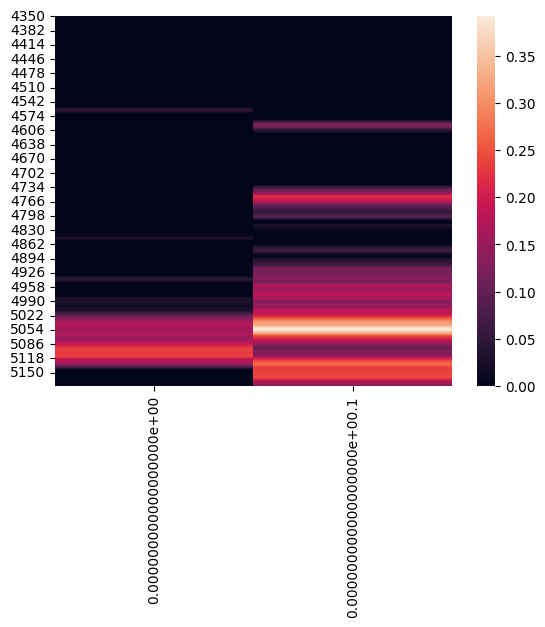

In [ ]:
import os
os.getcwd( )
import pandas as pd
df=pd.read_csv('dataVA-PFC.csv')
df2=df[4350:5180]
fig, ax=plt.subplots()
import seaborn as sns
sns.heatmap(df2)
ax.xlabel='Primary Motor Cortex'

In [ ]:
plot_recordings(
    figname=f"test_plots/new_structure4/fish_presentation_{13}.png",
    recordings=recordings,
    recording_times=recording_times,
    chunk=0,
    shape=(3, 4),
    plan=plot_list,
    time_lim=recording_times.time_lims(chunk=0, period=1),
    dpi=300)

generate fig test_plots/new_structure4/fish_presentation_13.png... Done


In [ ]:
import seaborn as sns
import pandas as pd

dd=pd.read_csv('dataGPi-PFC.csv')
print(dd.head)
import seaborn as sns
import pandas as pd

dd=pd.read_csv('dataGPe.csv')
print(dd.head)

<bound method NDFrame.head of         3.076273304747469961e-01  2.640132458763716494e-01
0                       0.589361                  0.604339
1                       0.805298                  0.849910
2                       0.848681                  1.059932
3                       0.852557                  1.251637
4                       1.001092                  1.240058
...                          ...                       ...
182994                  2.762987                  0.000000
182995                  2.740250                  0.000000
182996                  2.754361                  0.000000
182997                  2.843351                  0.000000
182998                  2.941650                  0.000000

[182999 rows x 2 columns]>
<bound method NDFrame.head of         1.494106053670226364e-01  7.958343068463433201e-02
0                       0.277388                  0.189781
1                       0.414617                  0.166830
2                       0.4

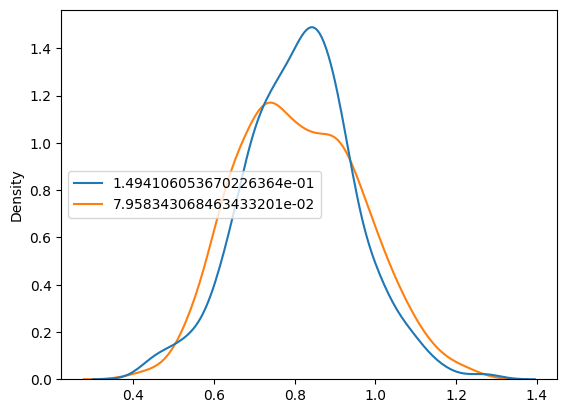

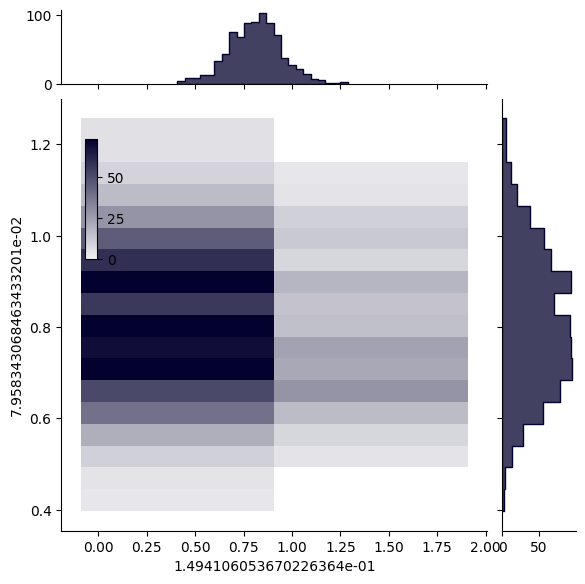

In [ ]:
sns.kdeplot(dd[4350:5180])
x=dd['1.494106053670226364e-01']
y=dd['7.958343068463433201e-02']
g = sns.JointGrid(data=dd[4350:5180], x="1.494106053670226364e-01", y="7.958343068463433201e-02", marginal_ticks=True)
cax = g.figure.add_axes([.15, .55, .02, .2])
g.plot_joint(
    sns.histplot, discrete=(True, False),
    cmap="light:#03012d", pmax=.8, cbar=True, cbar_ax=cax
)
g.plot_marginals(sns.histplot, element="step", color="#03012d")
sns.set_theme(style="white")

<Axes: >

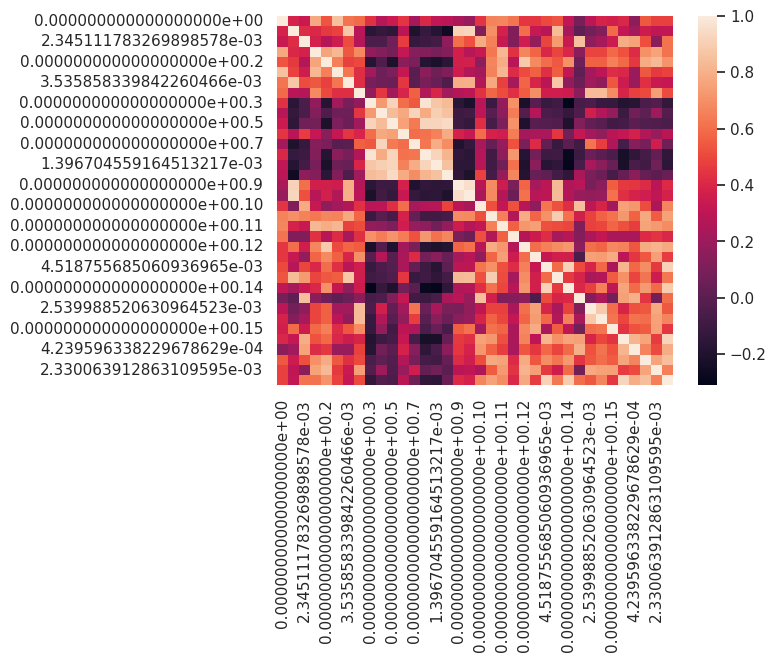

In [ ]:
dirpa=pd.read_csv('dataPFC_MTL.csv')
dirpa=pd.DataFrame(dirpa)
dirpa.describe
# calculate the correlation matrix on the numeric columns
corr = dirpa.select_dtypes('number').corr()
# plot the heatmap
sns.heatmap(corr)




<Axes: >

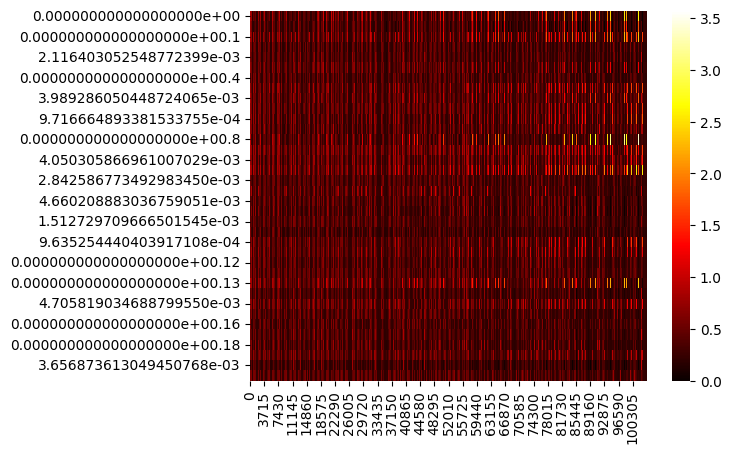

In [ ]:
dird1=pd.read_csv('dataStrThal-PFC.csv')
gpi=pd.read_csv('dataGPi-PFC.csv')
pm=pd.read_csv('dataPM.csv')
indir=pd.read_csv('dataPFC_MTL.csv')
sns.heatmap(indir.T,cmap='hot')

{'DF': -1.0, 'TF': 0.0, 'VF': 1.0, 'MA': 1.0}